In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
%matplotlib inline

# Linear Regression
from sklearn.linear_model import LinearRegression

# Cross Validate
from sklearn.model_selection import cross_validate

# Decision Tree
from sklearn.tree import DecisionTreeClassifier

# KNN
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix

# PCA
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Random Forest
from sklearn.ensemble import RandomForestClassifier

# SVC
from sklearn.svm import SVC

# Clustering
from sklearn.cluster import KMeans

# Logistic Regression
from sklearn.linear_model import LogisticRegression

In [2]:
dataset = pd.read_csv("project-vehicle.csv")

In [3]:
len(dataset)

846

In [4]:
dataset.shape

(846, 19)

In [5]:
dataset.keys()

Index(['COMPACTNESS', 'CIRCULARITY', 'DISTANCE CIRCULARITY', 'RADIUS RATIO',
       'PR AXIS ASPECT RATIO', 'MAX LENGTH ASPECT RATIO', 'SCATTER RATIO',
       'ELONGATEDNESS', 'PR AXISRECTANGULAR', 'LENGTHRECTANGULAR',
       'MAJORVARIANCE', 'MINORVARIANCE', 'GYRATIONRADIUS', 'MAJORSKEWNESS',
       'MINORSKEWNESS', 'MINORKURTOSIS', 'MAJORKURTOSIS', 'HOLLOWS RATIO',
       'target'],
      dtype='object')

In [6]:
dataset.head(10)

,COMPACTNESS,CIRCULARITY,DISTANCE CIRCULARITY,RADIUS RATIO,PR AXIS ASPECT RATIO,MAX LENGTH ASPECT RATIO,SCATTER RATIO,ELONGATEDNESS,PR AXISRECTANGULAR,LENGTHRECTANGULAR,MAJORVARIANCE,MINORVARIANCE,GYRATIONRADIUS,MAJORSKEWNESS,MINORSKEWNESS,MINORKURTOSIS,MAJORKURTOSIS,HOLLOWS RATIO,target
0,95.0,43.0,96.0,202.0,65.0,10.0,189.0,35.0,22.0,143.0,217.0,534.0,166.0,71.0,6.0,27.0,190.0,197.0,1
1,96.0,52.0,104.0,222.0,67.0,9.0,198.0,33.0,23.0,163.0,217.0,589.0,226.0,67.0,12.0,20.0,192.0,201.0,1
2,107.0,52.0,101.0,218.0,64.0,11.0,202.0,33.0,23.0,164.0,219.0,610.0,192.0,65.0,17.0,2.0,197.0,206.0,1
3,97.0,37.0,78.0,181.0,62.0,8.0,161.0,41.0,20.0,131.0,182.0,389.0,117.0,62.0,2.0,28.0,203.0,211.0,1
4,96.0,54.0,104.0,175.0,58.0,10.0,215.0,31.0,24.0,175.0,221.0,682.0,222.0,75.0,13.0,23.0,186.0,194.0,1
5,97.0,55.0,103.0,197.0,63.0,11.0,215.0,31.0,24.0,172.0,219.0,677.0,219.0,75.0,5.0,24.0,185.0,194.0,1
6,105.0,54.0,105.0,213.0,67.0,10.0,200.0,33.0,23.0,163.0,214.0,597.0,214.0,68.0,10.0,20.0,190.0,198.0,1
7,105.0,52.0,107.0,207.0,60.0,11.0,218.0,31.0,24.0,167.0,221.0,701.0,197.0,66.0,0.0,20.0,191.0,203.0,1
8,89.0,41.0,75.0,143.0,56.0,7.0,146.0,46.0,19.0,137.0,170.0,317.0,156.0,76.0,18.0,5.0,184.0,188.0,1
9,86.0,41.0,66.0,129.0,55.0,7.0,135.0,50.0,18.0,136.0,154.0,266.0,165.0,74.0,3.0,4.0,180.0,187.0,1


In [7]:
dataset.describe()

,COMPACTNESS,CIRCULARITY,DISTANCE CIRCULARITY,RADIUS RATIO,PR AXIS ASPECT RATIO,MAX LENGTH ASPECT RATIO,SCATTER RATIO,ELONGATEDNESS,PR AXISRECTANGULAR,LENGTHRECTANGULAR,MAJORVARIANCE,MINORVARIANCE,GYRATIONRADIUS,MAJORSKEWNESS,MINORSKEWNESS,MINORKURTOSIS,MAJORKURTOSIS,HOLLOWS RATIO,target
count,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.00000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000
mean,93.678487,44.861702,82.088652,168.940898,61.693853,8.567376,168.839243,40.933806,20.582742,147.998818,188.625296,439.911348,174.70331,72.462175,6.377069,12.599291,188.932624,195.632388,2.477541
std,8.234474,6.169866,15.771533,33.472183,7.888251,4.601217,33.244978,7.811560,2.592138,14.515652,31.394837,176.692614,32.54649,7.486974,4.918353,8.931240,6.163949,7.438797,1.105700
min,73.000000,33.000000,40.000000,104.000000,47.000000,2.000000,112.000000,26.000000,17.000000,118.000000,130.000000,184.000000,109.00000,59.000000,0.000000,0.000000,176.000000,181.000000,1.000000
25%,87.000000,40.000000,70.000000,141.000000,57.000000,7.000000,146.250000,33.000000,19.000000,137.000000,167.000000,318.250000,149.00000,67.000000,2.000000,5.000000,184.000000,190.250000,1.250000
50%,93.000000,44.000000,80.000000,167.000000,61.000000,8.000000,157.000000,43.000000,20.000000,146.000000,178.500000,364.000000,173.00000,71.500000,6.000000,11.000000,188.000000,197.000000,2.000000
75%,100.000000,49.000000,98.000000,195.000000,65.000000,10.000000,198.000000,46.000000,23.000000,159.000000,217.000000,587.000000,198.00000,75.000000,9.000000,19.000000,193.000000,201.000000,3.000000
max,119.000000,59.000000,112.000000,333.000000,138.000000,55.000000,265.000000,61.000000,29.000000,188.000000,320.000000,1018.000000,268.00000,135.000000,22.000000,41.000000,206.000000,211.000000,4.000000


In [8]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   COMPACTNESS              846 non-null    float64
 1   CIRCULARITY              846 non-null    float64
 2   DISTANCE CIRCULARITY     846 non-null    float64
 3   RADIUS RATIO             846 non-null    float64
 4   PR AXIS ASPECT RATIO     846 non-null    float64
 5   MAX LENGTH ASPECT RATIO  846 non-null    float64
 6   SCATTER RATIO            846 non-null    float64
 7   ELONGATEDNESS            846 non-null    float64
 8   PR AXISRECTANGULAR       846 non-null    float64
 9   LENGTHRECTANGULAR        846 non-null    float64
 10  MAJORVARIANCE            846 non-null    float64
 11  MINORVARIANCE            846 non-null    float64
 12  GYRATIONRADIUS           846 non-null    float64
 13  MAJORSKEWNESS            846 non-null    float64
 14  MINORSKEWNESS            8

In [9]:
dataset.target.unique()

array([1, 2, 3, 4], dtype=int64)

In [10]:
print(dataset.groupby('target').size())

target
1    212
2    217
3    218
4    199
dtype: int64


<AxesSubplot:ylabel='Density'>

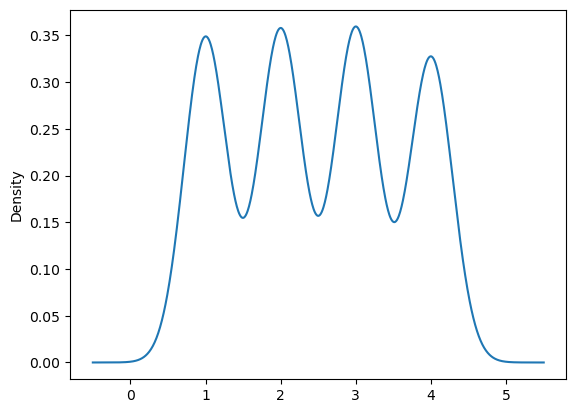

In [11]:
dataset.target.plot.density()

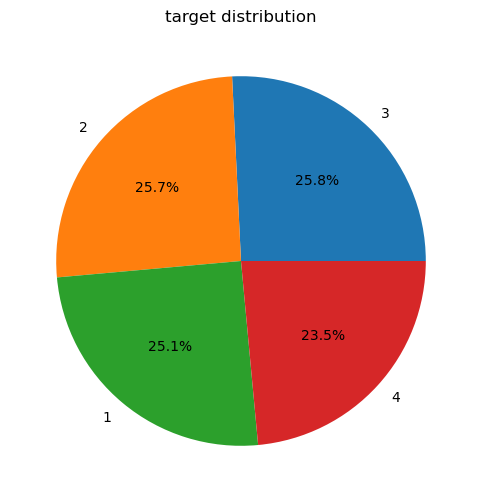

In [12]:
# A pie chart or donut chart is used to show the percentages of categorical data.
# Kategorik verilerin yüzdesel oranlarını göstermek için pasta grafiği veya donut grafiği kullanılır.

# Select the categorical variable
categorical_var = 'target'

# Calculate the values and counts of the categorical variable in the dataset
category_counts = dataset[categorical_var].value_counts()
categories = category_counts.index
counts = category_counts.values

# Draw the pie chart
plt.figure(figsize=(8, 6))
plt.pie(counts, labels=categories, autopct='%1.1f%%')
plt.title(f"{categorical_var} distribution")
plt.show()

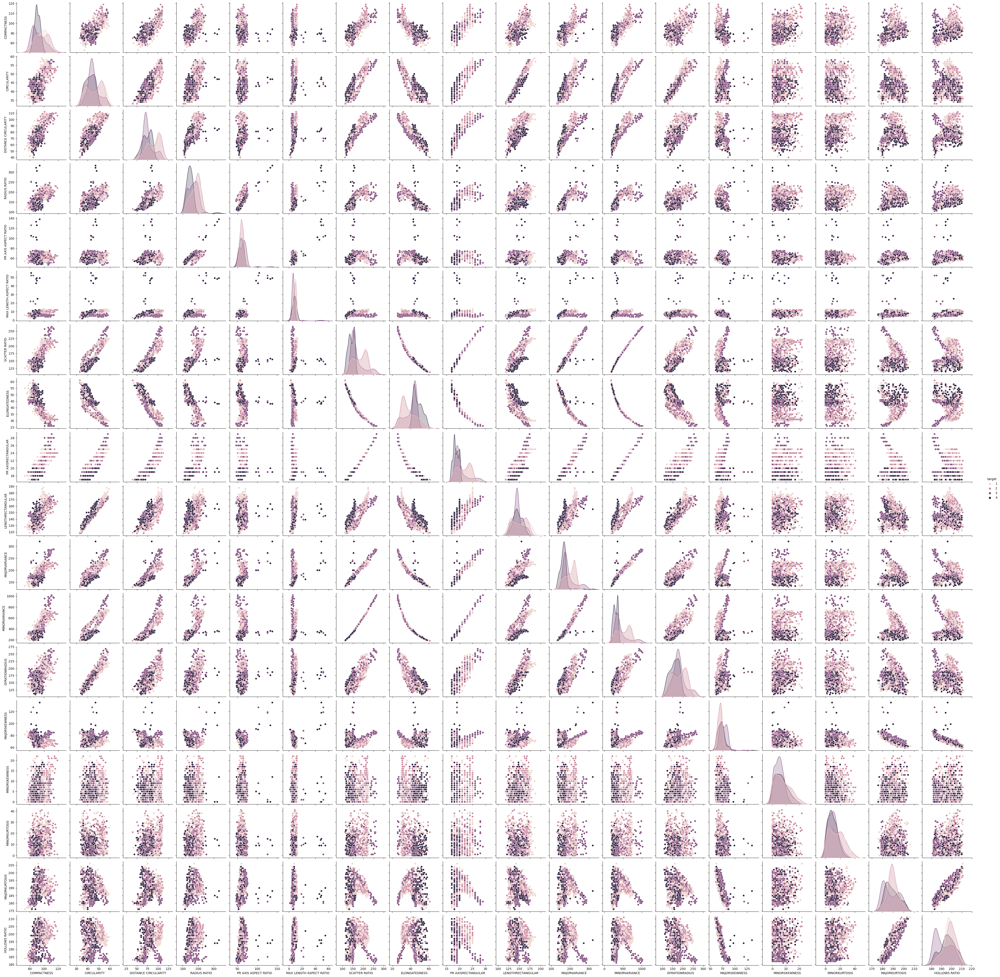

In [13]:
sns.pairplot(dataset,hue='target')
plt.show()

<Figure size 1000x600 with 0 Axes>

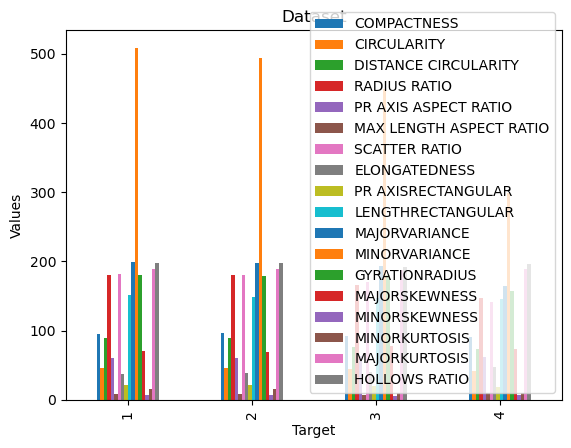

In [14]:
# Show the averages of each columns as histograms
plt.figure(figsize=(10,6))
data_mean = dataset.groupby(dataset.target).mean()
data_mean.plot.bar()
plt.title("Dataset")
plt.xlabel("Target")
plt.ylabel("Values")
plt.show()

We check the missing data of each cell with the "isnull()" function. Then we calculate the number of missing values with the sum() function. This way we can display the number of missing values in each column.

"isnull()" fonksiyonu ile her hücrenin eksik olan verilerini kontrol ediyoruz. Ardından sum() fonksiyonu ile eksik değer sayısını hesaplıyoruz. Bu şekilde her sütundaki eksik değer sayısını görüntüleyebiliriz.

In [15]:
# Checking for missing values
missing_values = dataset.isnull().sum()
print(missing_values)

COMPACTNESS                0
CIRCULARITY                0
DISTANCE CIRCULARITY       0
RADIUS RATIO               0
PR AXIS ASPECT RATIO       0
MAX LENGTH ASPECT RATIO    0
SCATTER RATIO              0
ELONGATEDNESS              0
PR AXISRECTANGULAR         0
LENGTHRECTANGULAR          0
MAJORVARIANCE              0
MINORVARIANCE              0
GYRATIONRADIUS             0
MAJORSKEWNESS              0
MINORSKEWNESS              0
MINORKURTOSIS              0
MAJORKURTOSIS              0
HOLLOWS RATIO              0
target                     0
dtype: int64


In [16]:
pip install missingno

Note: you may need to restart the kernel to use updated packages.


<AxesSubplot:>

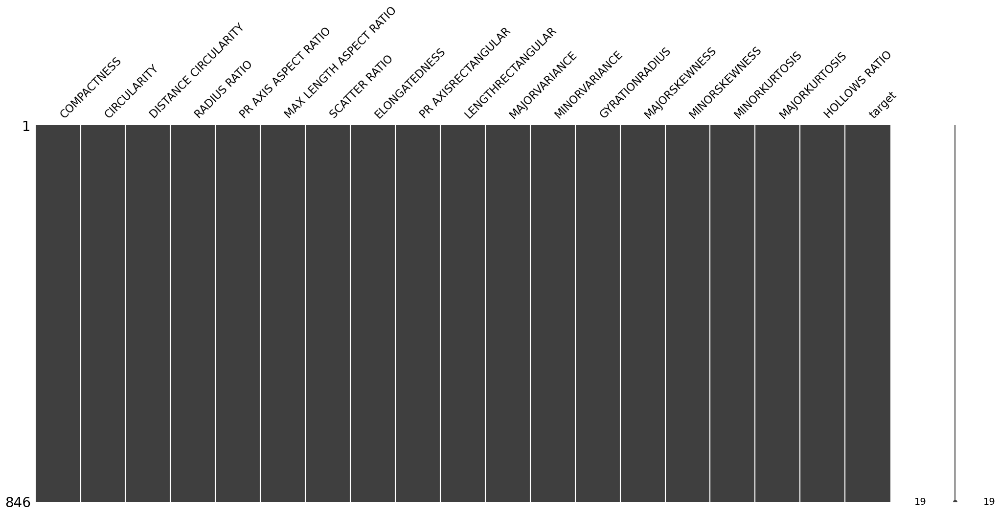

In [17]:
import missingno as msno
msno.matrix(dataset)

We can use the "fillna()" and "dropna()" functions to fill or remove rows or columns with missing values.

Eksik değerlerin olduğu satırları ya da sütunları doldurma veya kaldırma işlemleri için ise "fillna()" ve "dropna()" fonksiyonlarını kullanabiliriz.

In [18]:
# We don't have to use these functions because there is no data missing in the data set.

dataset.dropna(axis=0, inplace= True)

# Filling the missing values in the columns with the average
dataset['COMPACTNESS'].fillna(dataset['COMPACTNESS'].mean(), inplace=True)

# Filling missing values in columns with median
dataset['COMPACTNESS'].fillna(dataset['COMPACTNESS'].median(), inplace=True)

# Filling the missing values in the columns with the most frequently used value
dataset['COMPACTNESS'].fillna(dataset['COMPACTNESS'].mode()[0], inplace=True)


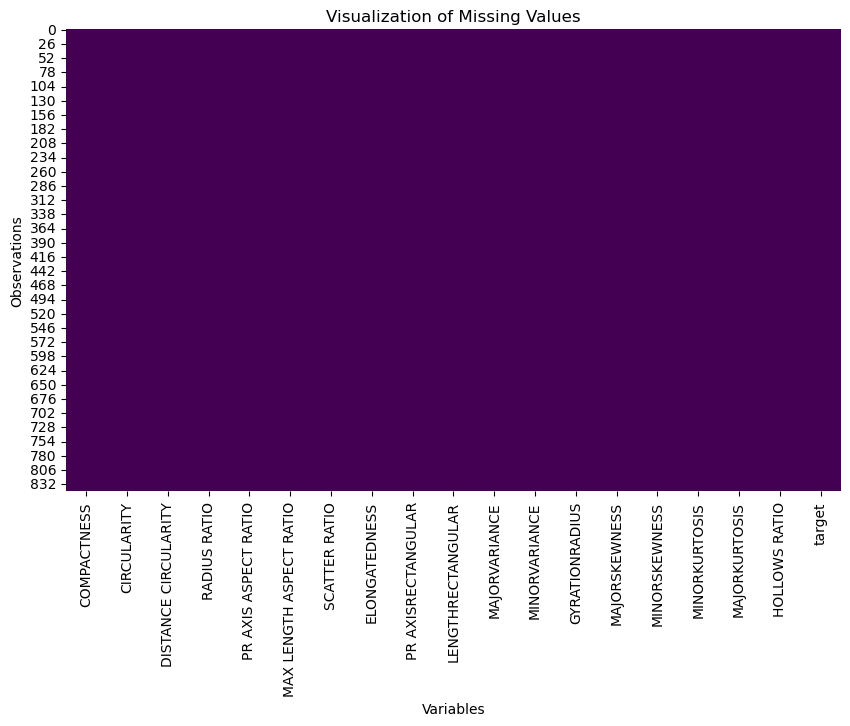

In [19]:
# Visualization of missing values
plt.figure(figsize=(10, 6))
plt.title("Visualization of Missing Values")
sns.heatmap(dataset.isnull(), cmap='viridis', cbar=False)
plt.xlabel("Variables")
plt.ylabel("Observations")
plt.show()

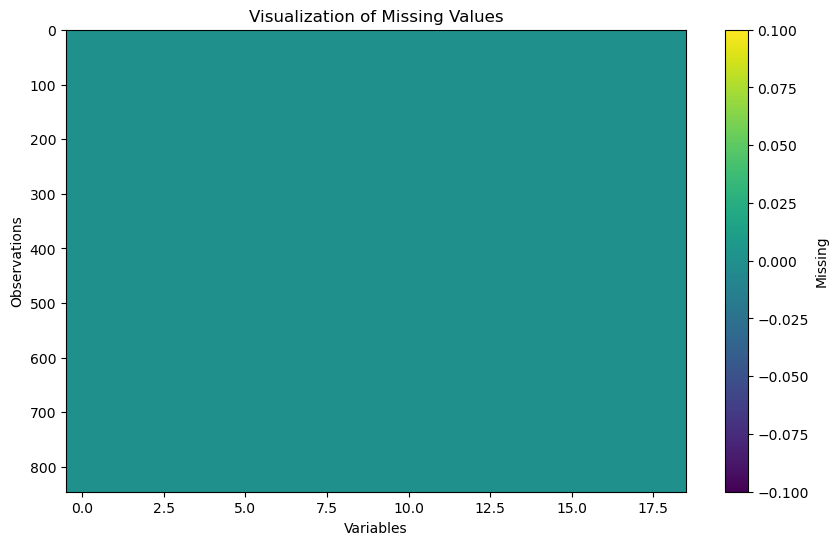

In [20]:
# Visualization of missing values
plt.figure(figsize=(10, 6))
plt.title("Visualization of Missing Values")
plt.imshow(dataset.isnull(), cmap='viridis', aspect='auto')
plt.xlabel("Variables")
plt.ylabel("Observations")
plt.colorbar(label="Missing")
plt.show()

In the code, we draw a box plot using the seaborn library. The boxplot is a commonly used method for visualizing outliers. A box is drawn for each column and outliers are represented by dots.

Kodda, seaborn kütüphanesini kullanarak kutu grafiği (box plot) çiziyoruz. Kutu grafiği, aykırı değerleri görselleştirmek için yaygın olarak kullanılan bir yöntemdir. Her sütun için bir kutu çizilir ve aykırı değerler noktalarla temsil edilir.

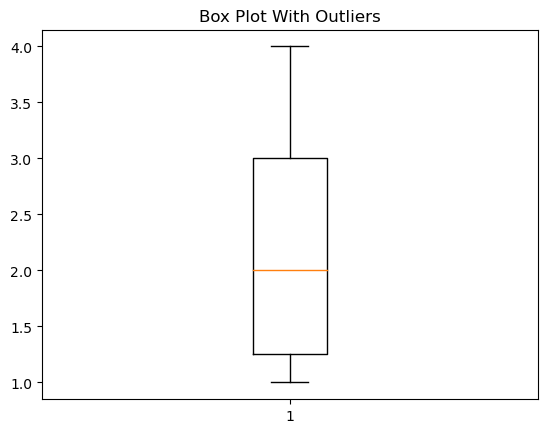

In [21]:
# Create a box plot to visualize outliers
plt.boxplot(dataset.target)
plt.title("Box Plot With Outliers")
plt.show()

C:\Users\dogan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


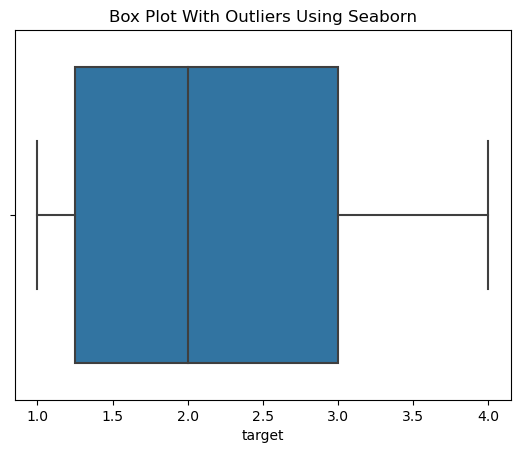

In [22]:
sns.boxplot(dataset.target)
plt.title("Box Plot With Outliers Using Seaborn")
plt.show()

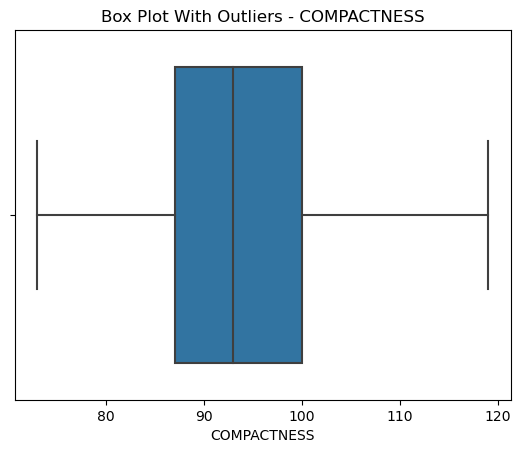

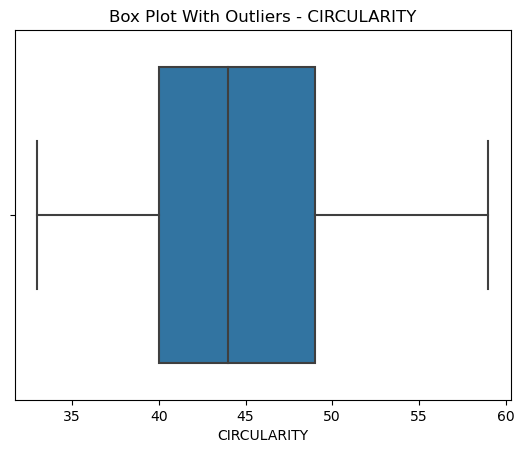

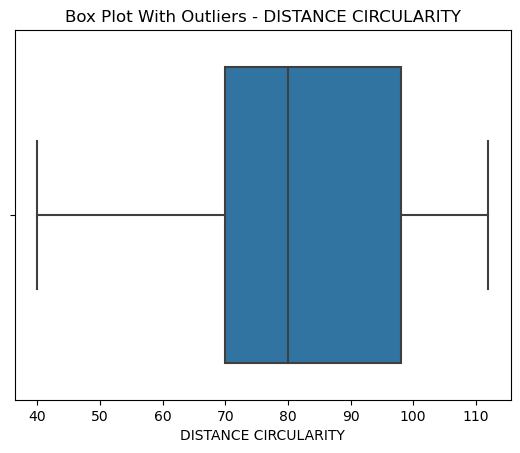

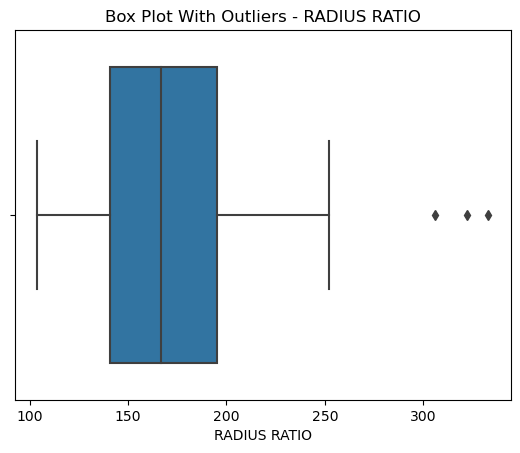

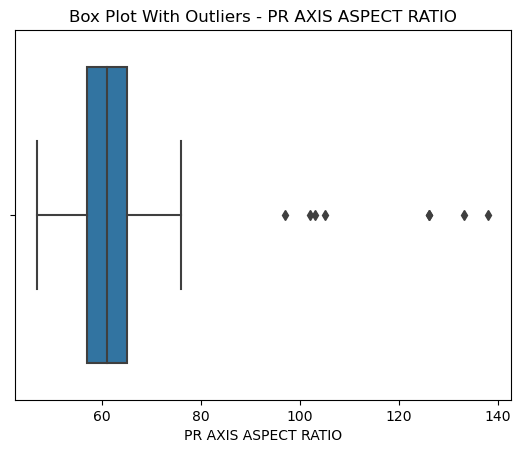

...

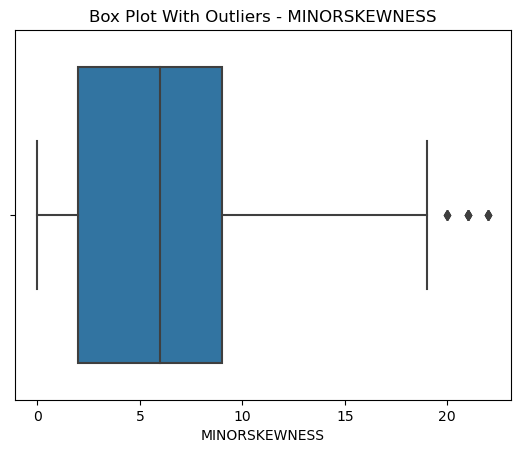

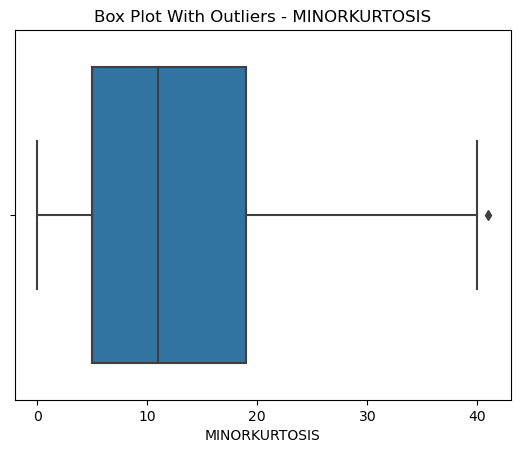

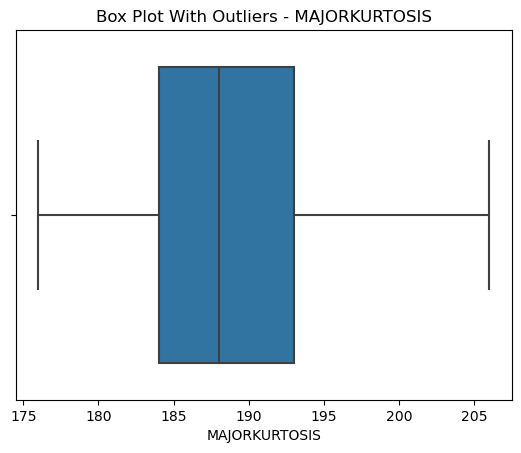

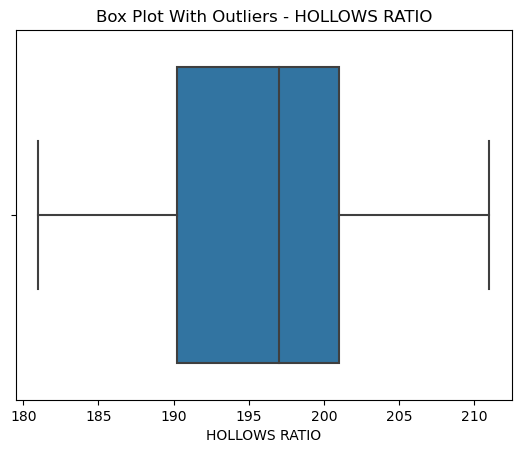

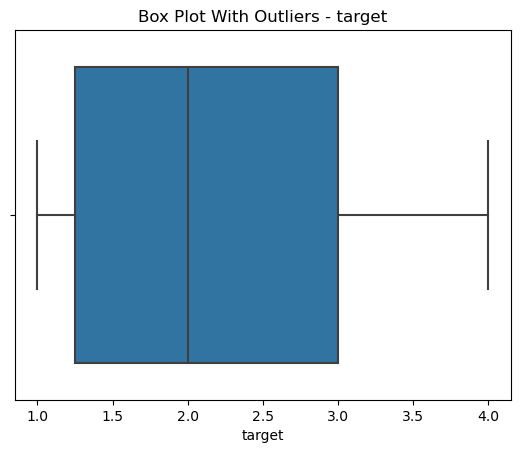

In [23]:
# Draw box plot for each column separately
for column in dataset.columns:
    sns.boxplot(x=dataset[column])
    plt.title("Box Plot With Outliers - "+column)
    plt.show()

We can use encoding methods to convert categorical values to numeric values. For example, we can convert nominal categorical variables with one-hot encoding or label encoding.
encoded_data = pd.get_dummies(dataset.target)
label_encoder = LabelEncoder()
dataset.target = label_encoder.fit_transform(dataset.target)
But we don't need such a thing in this dataset.

Kategorik değerleri sayısal değerlere dönüştürmek için kodlama yöntemlerini kullanabilirsiniz. Örneğin, nominal kategorik değişkenleri one-hot encoding veya label encoding yöntemleriyle dönüştürebilirsiniz.
encoded_data = pd.get_dummies(dataset.target)
label_encoder = LabelEncoder()
dataset.target = label_encoder.fit_transform(dataset.target)
Ama bizim bu veri setinde böyle bir şeye ihtiyaçımız yok.

We can use the duplicated() function to detect duplicate rows in your dataset. This function returns a boolean (True/False) series indicating whether each row is repeated.
We can use the drop_duplicates() function to remove duplicate rows. This function removes duplicate rows from the dataset and returns a cleaned dataset.
After removing duplicate rows, we can check the cleaned dataset.

Veri setinizdeki yinelenen satırları tespit etmek için duplicated() fonksiyonunu kullanabilirsiniz. Bu fonksiyon, her bir satırın yinelenip yinelenmediğini belirten bir boolean (True/False) serisi döndürür.
Yinelenen satırları kaldırmak için drop_duplicates() fonksiyonunu kullanabilirsiniz. Bu fonksiyon, yinelenen satırları veri setinden kaldırır ve temizlenmiş bir veri seti döndürür.
Yinelenen satırları kaldırdıktan sonra, temizlenmiş veri setini kontrol edebiliriz.

In [24]:
# Detecting duplicate rows
duplicated_rows = dataset.duplicated()
duplicated_count = duplicated_rows.sum()

print("Total Duplicate Rows:", duplicated_count)

Total Duplicate Rows: 0


In [25]:
# Remove duplicate rows
dataset = dataset.drop_duplicates()

# Checking the cleaned dataset
print("Cleaned Dataset Row Count:", len(dataset))

Cleaned Dataset Row Count: 846


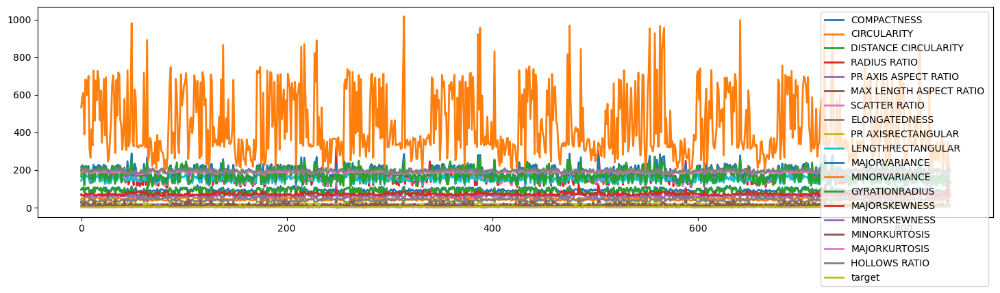

In [26]:
dataset.plot(figsize=(18,4), linewidth=2).legend(loc='upper right')

# Correlation

Heatmaps are often used to visualize the correlation matrix. The correlation matrix shows the relationships between the variables with a color scale. High positive correlations are shown in darker color while high negative correlations are shown in lighter color.

Korelasyon matrisini görselleştirmek için genellikle ısı haritaları (heatmap) kullanılır. Korelasyon matrisi, değişkenler arasındaki ilişkileri renk skalasıyla gösterir. Yüksek pozitif korelasyonlar daha koyu renkte gösterilirken, yüksek negatif korelasyonlar daha açık renkte gösterilir.

In [27]:
data_corr =dataset.corr()
data_corr

,COMPACTNESS,CIRCULARITY,DISTANCE CIRCULARITY,RADIUS RATIO,PR AXIS ASPECT RATIO,MAX LENGTH ASPECT RATIO,SCATTER RATIO,ELONGATEDNESS,PR AXISRECTANGULAR,LENGTHRECTANGULAR,MAJORVARIANCE,MINORVARIANCE,GYRATIONRADIUS,MAJORSKEWNESS,MINORSKEWNESS,MINORKURTOSIS,MAJORKURTOSIS,HOLLOWS RATIO,target
COMPACTNESS,1.000000,0.692869,0.792444,0.691659,0.093222,0.148249,0.813003,-0.788647,0.813437,0.676143,0.764415,0.818632,0.585347,-0.252984,0.233693,0.156779,0.297780,0.365552,-0.258411
CIRCULARITY,0.692869,1.000000,0.798492,0.622778,0.149692,0.247467,0.860367,-0.828755,0.857925,0.965776,0.808496,0.852679,0.936080,0.058669,0.148433,-0.015482,-0.113047,0.038677,-0.248088
DISTANCE CIRCULARITY,0.792444,0.798492,1.000000,0.771644,0.161529,0.264309,0.907280,-0.912307,0.895326,0.774524,0.864432,0.889661,0.705818,-0.231660,0.116478,0.264522,0.147980,0.335453,-0.416665
RADIUS RATIO,0.691659,0.622778,0.771644,1.000000,0.665407,0.448048,0.738460,-0.792557,0.711497,0.570154,0.797588,0.725781,0.539069,-0.182412,0.050534,0.174299,0.380757,0.469278,-0.375177
PR AXIS ASPECT RATIO,0.093222,0.149692,0.161529,0.665407,1.000000,0.648096,0.106064,-0.185086,0.079982,0.129168,0.274705,0.092182,0.124408,0.152304,-0.056807,-0.034180,0.238195,0.267381,0.051517
MAX LENGTH ASPECT RATIO,0.148249,0.247467,0.264309,0.448048,0.648096,1.000000,0.166769,-0.180044,0.161861,0.305943,0.319430,0.144606,0.189791,0.294548,0.015218,0.043379,-0.027317,0.143919,0.012975
SCATTER RATIO,0.813003,0.860367,0.907280,0.738460,0.106064,0.166769,1.000000,-0.973385,0.992088,0.810648,0.951862,0.996318,0.800932,-0.028618,0.074347,0.210706,0.004053,0.119950,-0.432469
ELONGATEDNESS,-0.788647,-0.828755,-0.912307,-0.792557,-0.185086,-0.180044,-0.973385,1.000000,-0.950512,-0.775531,-0.938392,-0.956522,-0.766146,0.104875,-0.053346,-0.185189,-0.112046,-0.216725,0.446360
PR AXISRECTANGULAR,0.813437,0.857925,0.895326,0.711497,0.079982,0.161861,0.992088,-0.950512,1.000000,0.813305,0.938266,0.992346,0.798282,-0.016333,0.082346,0.213088,-0.022056,0.098519,-0.418447
LENGTHRECTANGULAR,0.676143,0.965776,0.774524,0.570154,0.129168,0.305943,0.810648,-0.775531,0.813305,1.000000,0.747152,0.798071,0.866479,0.040339,0.137473,0.001183,-0.107718,0.076770,-0.154881


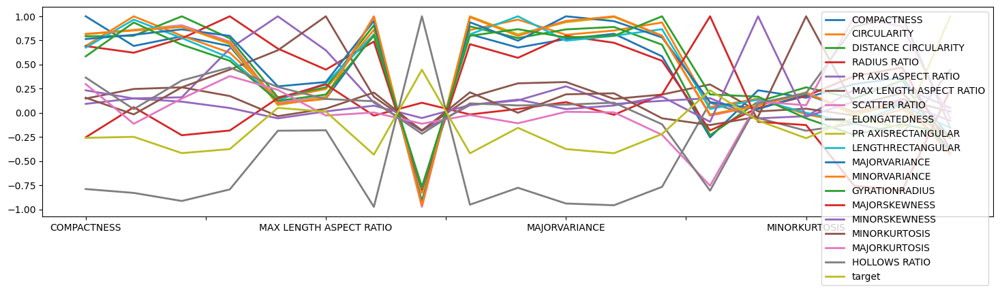

In [28]:
data_corr.plot(figsize=(18,4), linewidth=2).legend(loc='upper right')

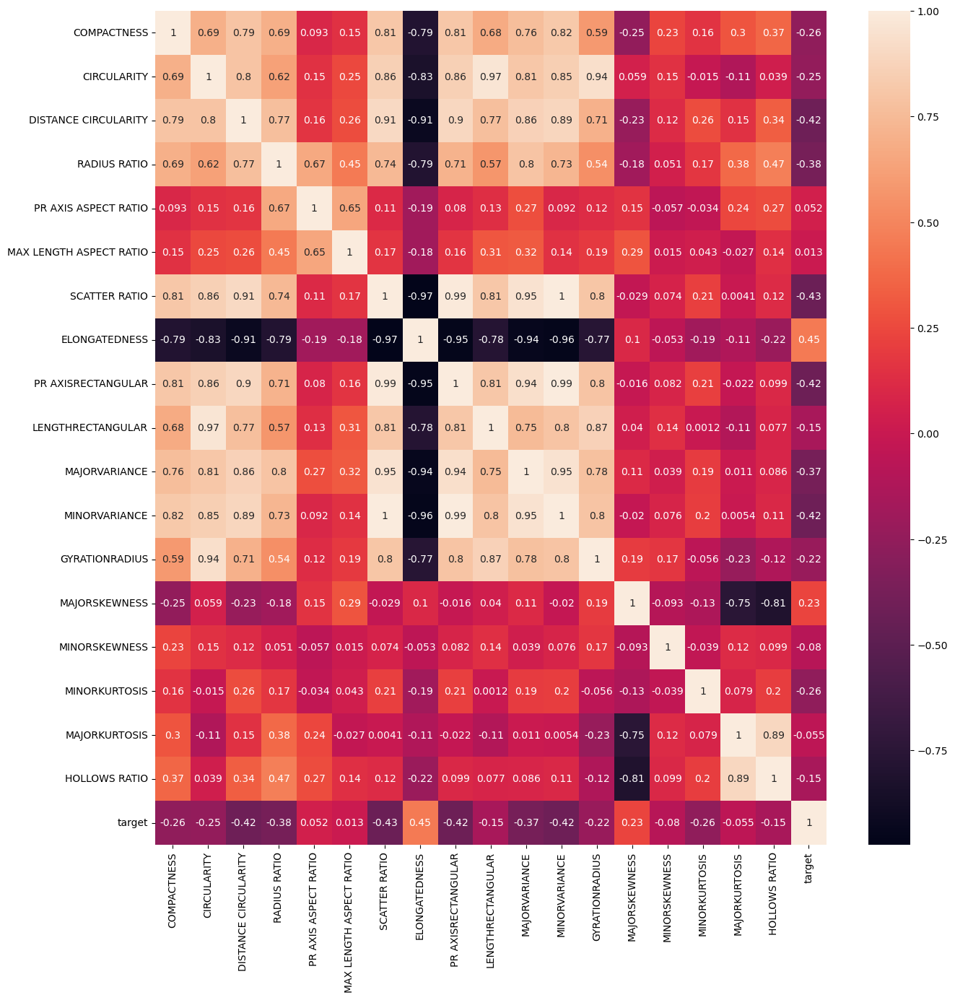

In [29]:
plt.figure(figsize = (15,15))
sns.heatmap(data_corr, annot=True)
plt.show()

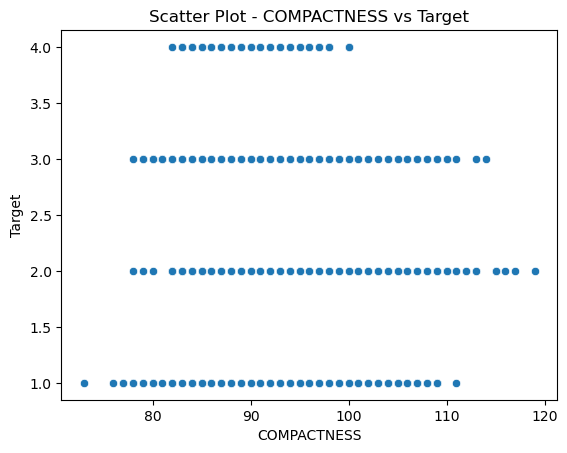

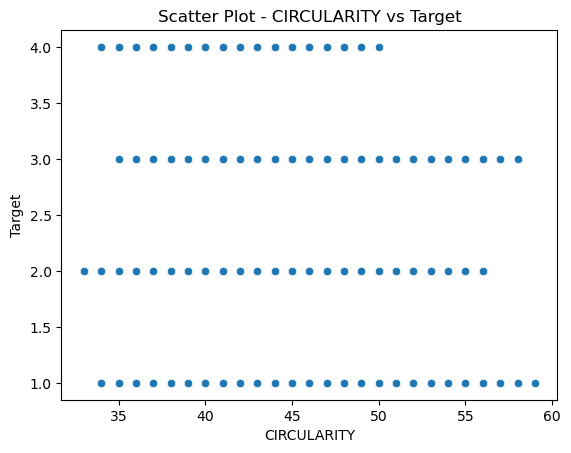

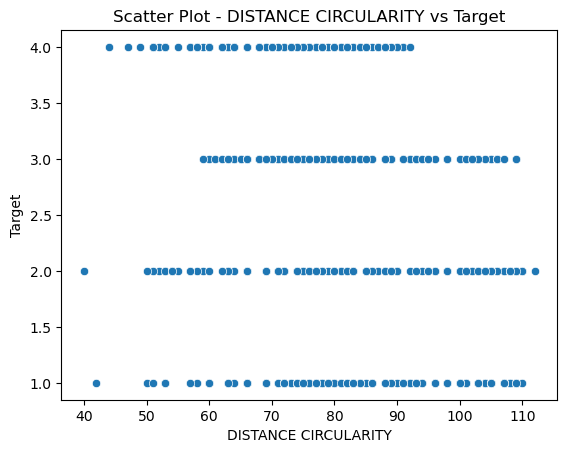

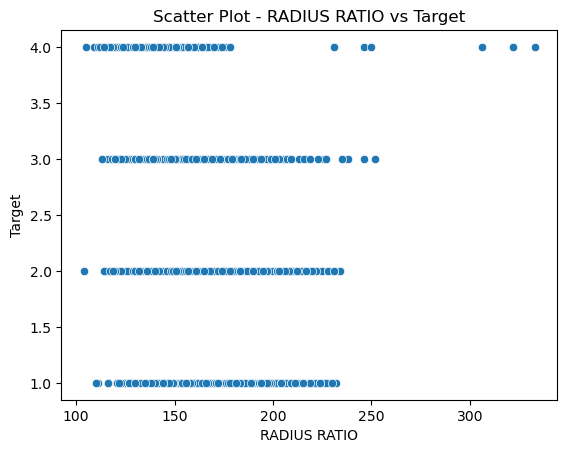

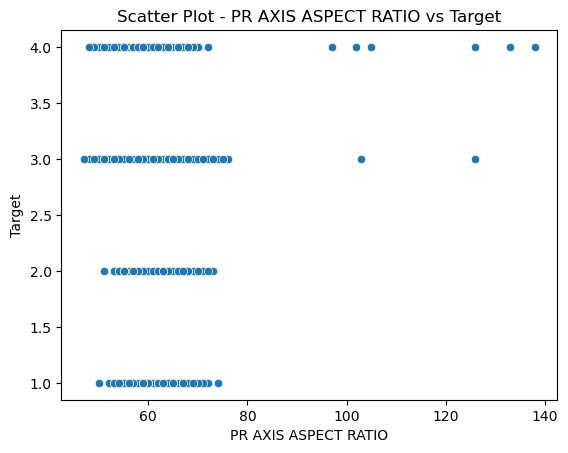

...

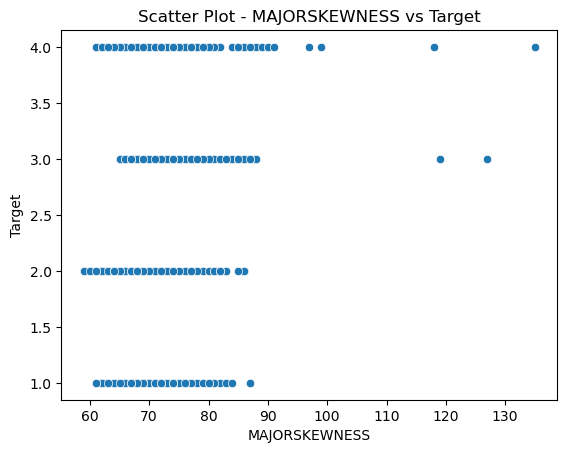

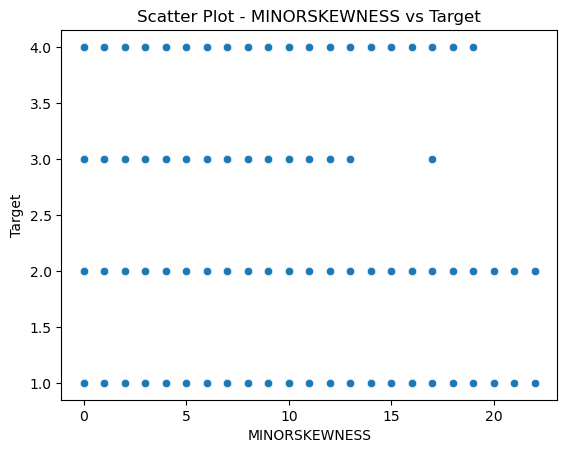

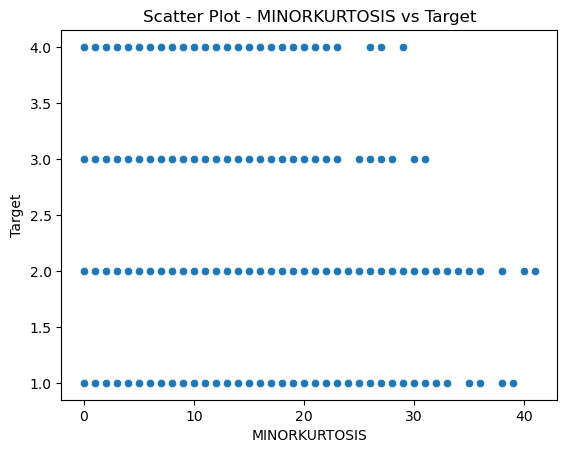

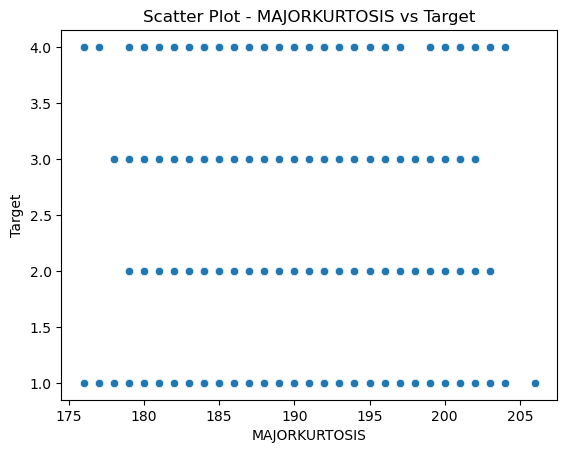

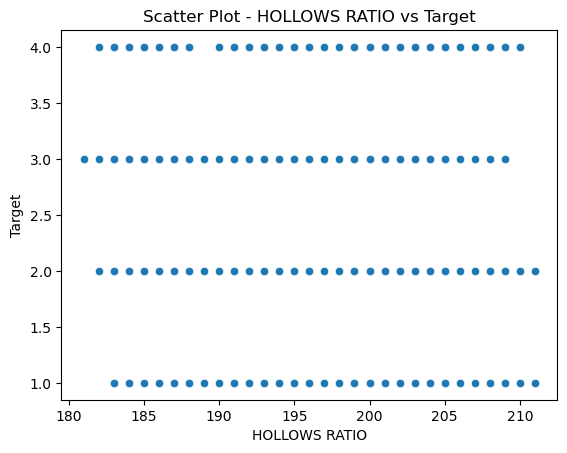

In [30]:
X = dataset.iloc[:, :18]  # Independent variables
y = dataset.iloc[:, 18]  # Target variable

for column in X.columns:
    sns.scatterplot(x=X[column], y=y)
    plt.xlabel(column)
    plt.ylabel("Target")
    plt.title("Scatter Plot - {} vs Target".format(column))
    plt.show()

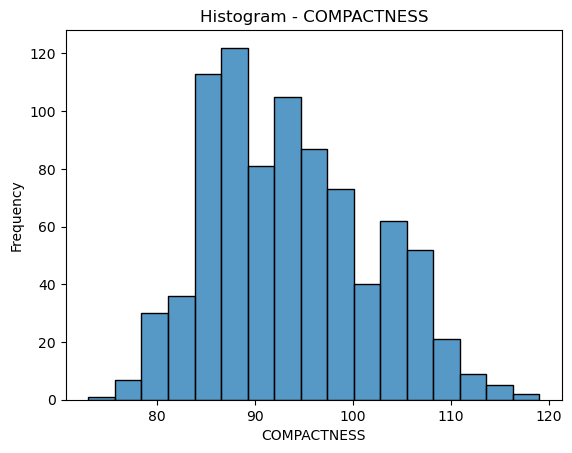

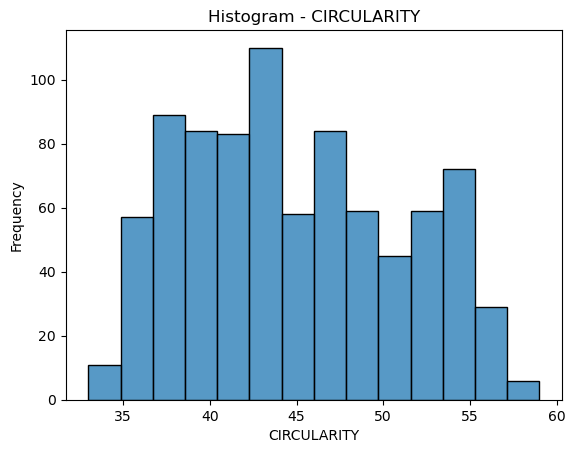

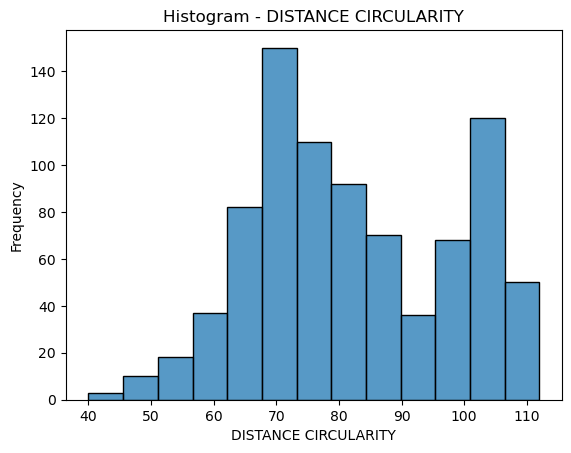

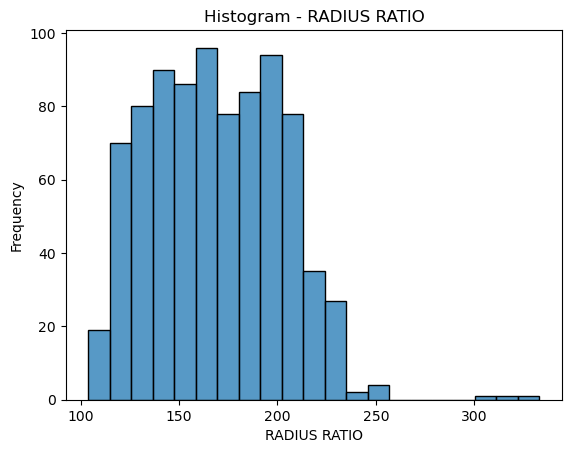

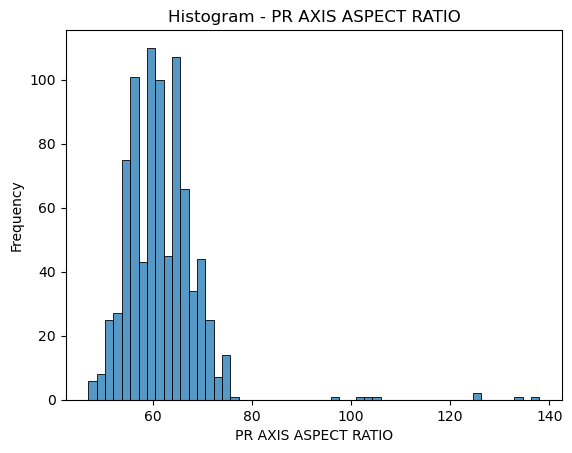

...

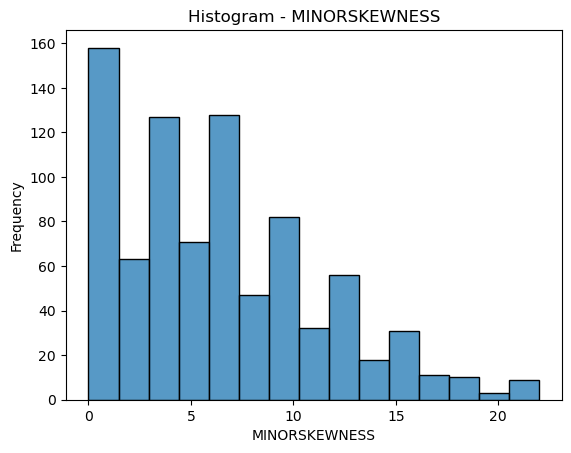

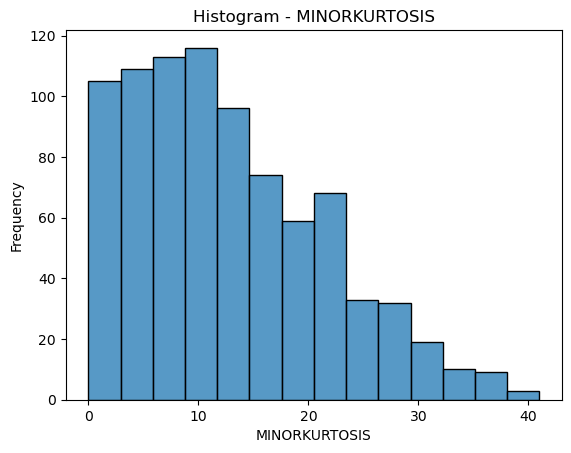

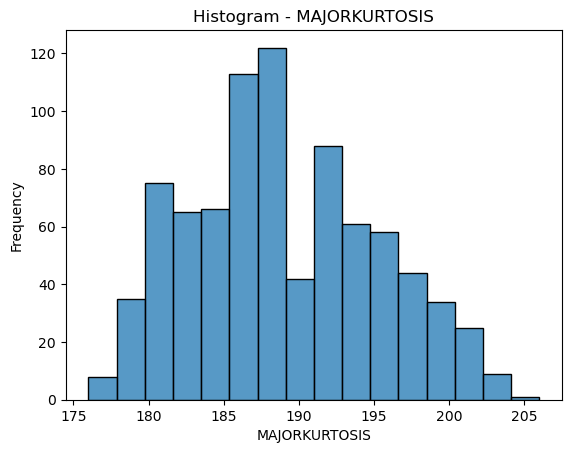

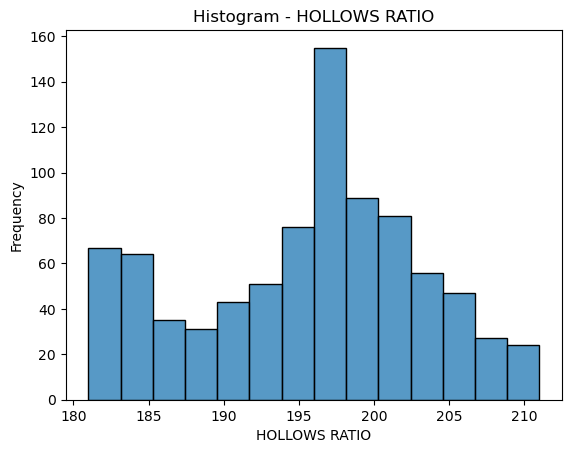

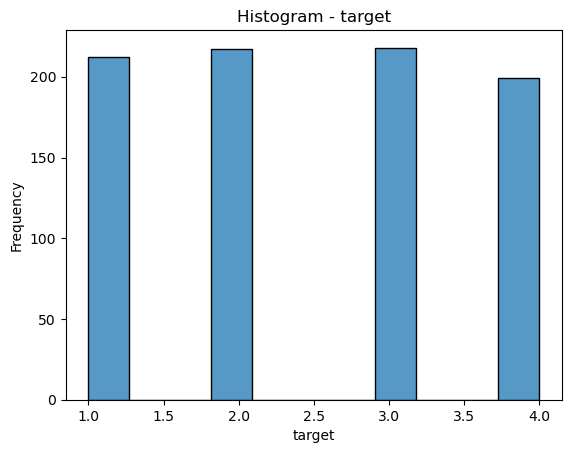

In [31]:
for column in dataset.columns:
    sns.histplot(dataset[column])
    plt.xlabel(column)
    plt.ylabel("Frequency")
    plt.title("Histogram - {}".format(column))
    plt.show()

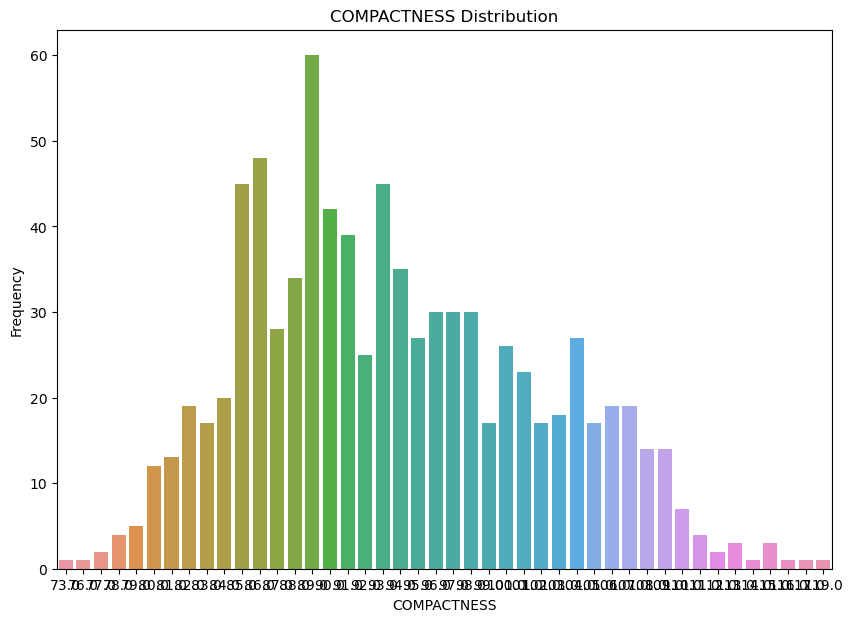

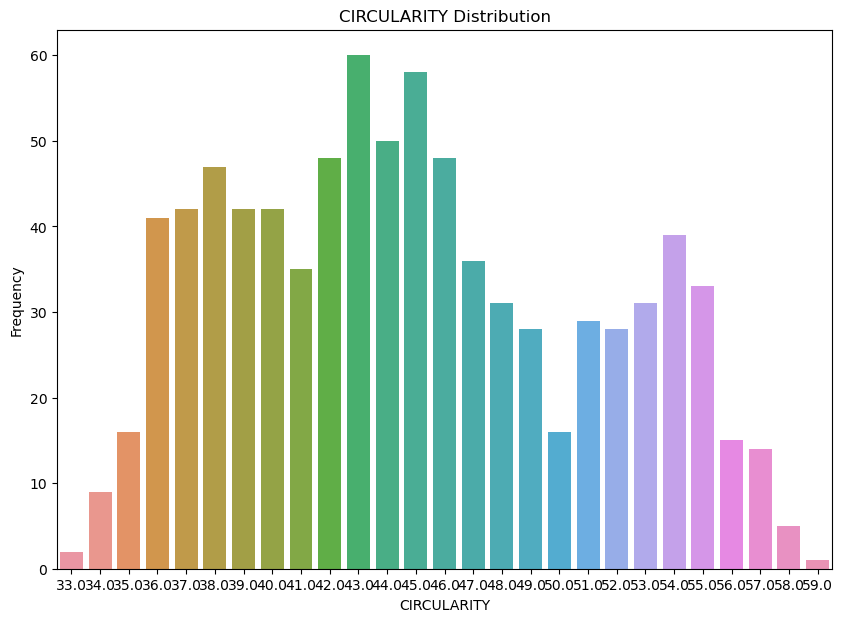

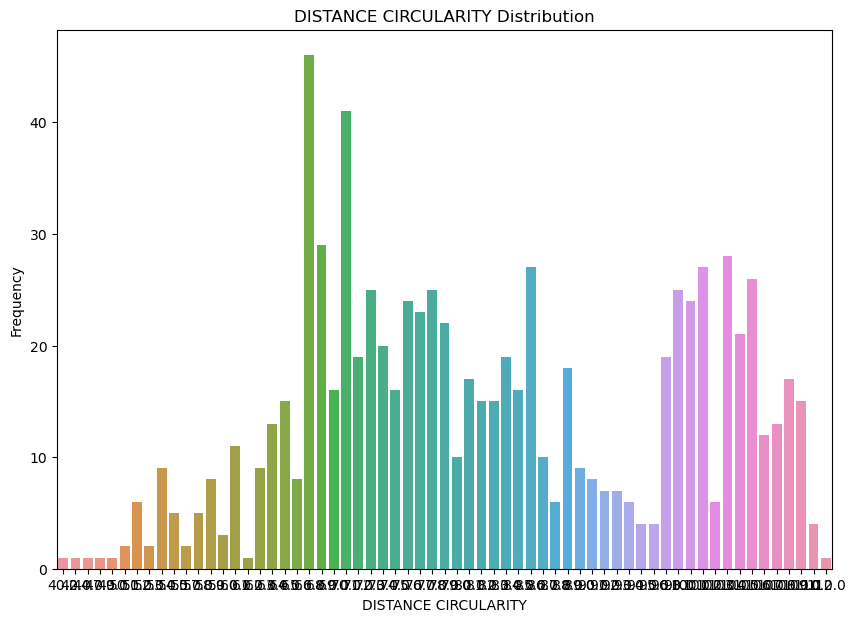

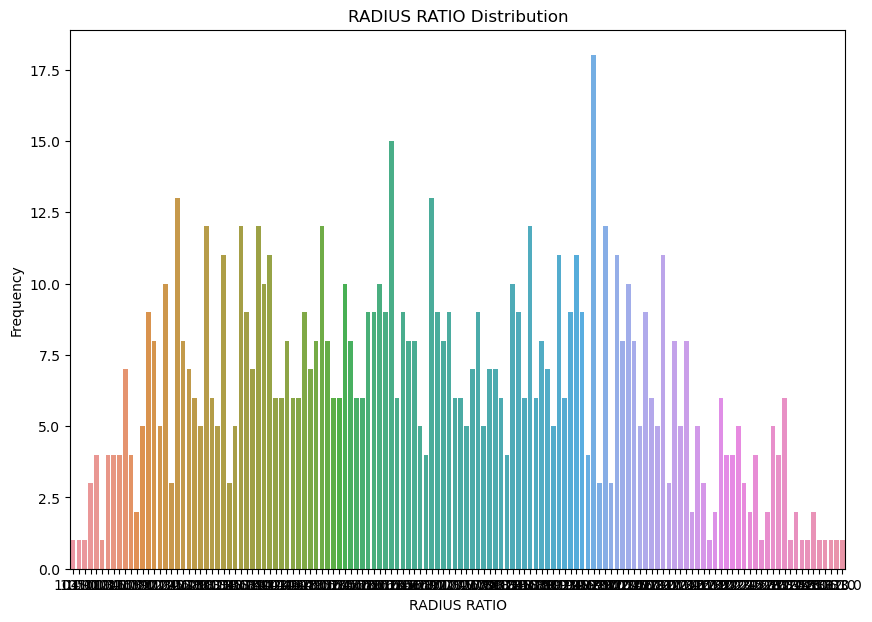

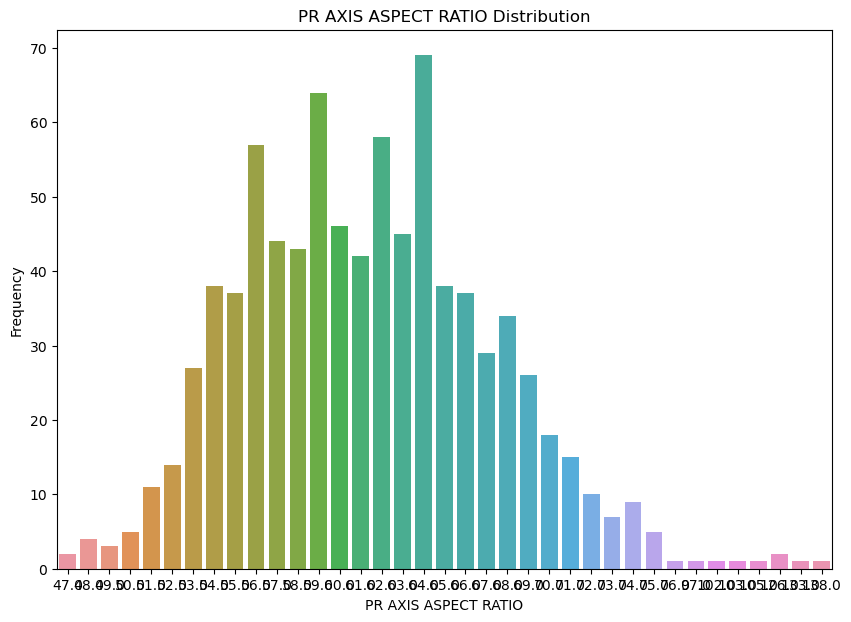

...

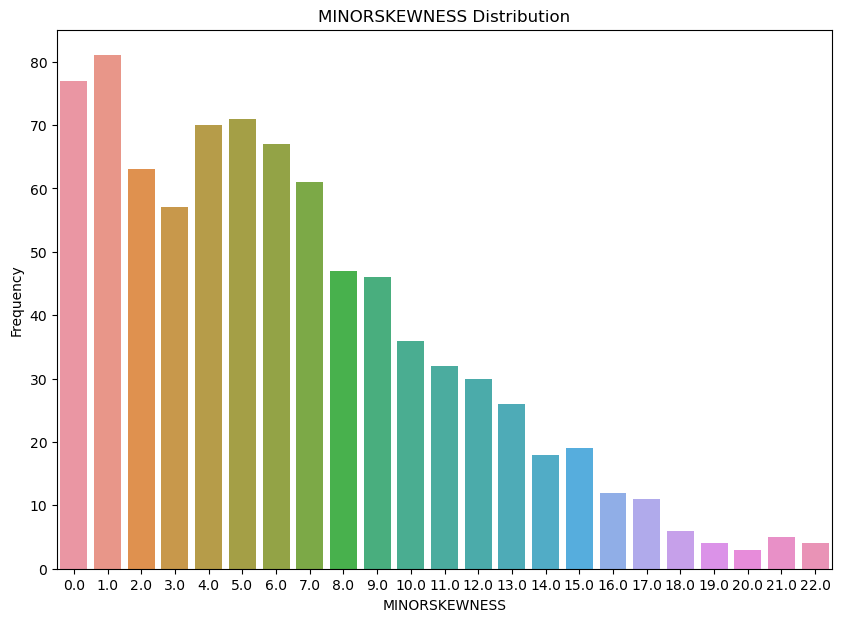

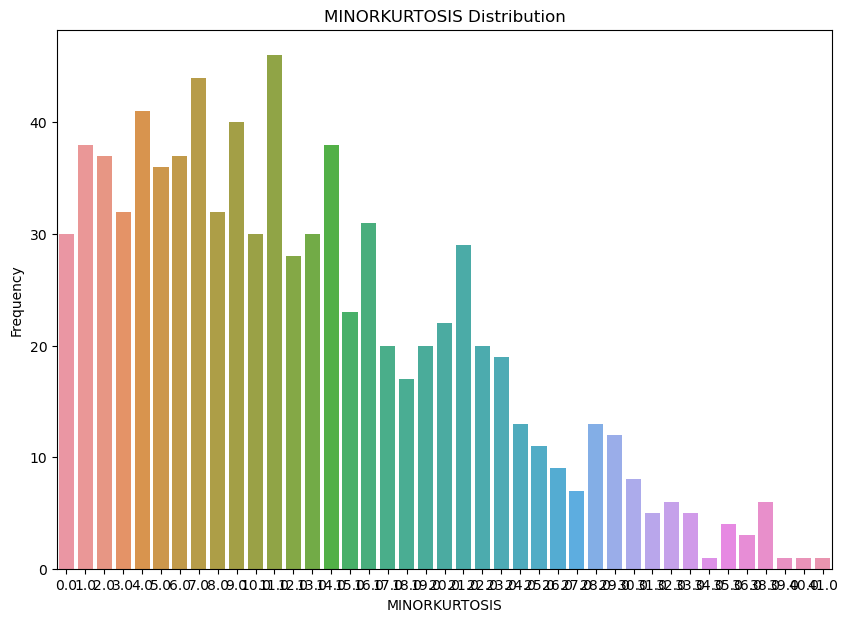

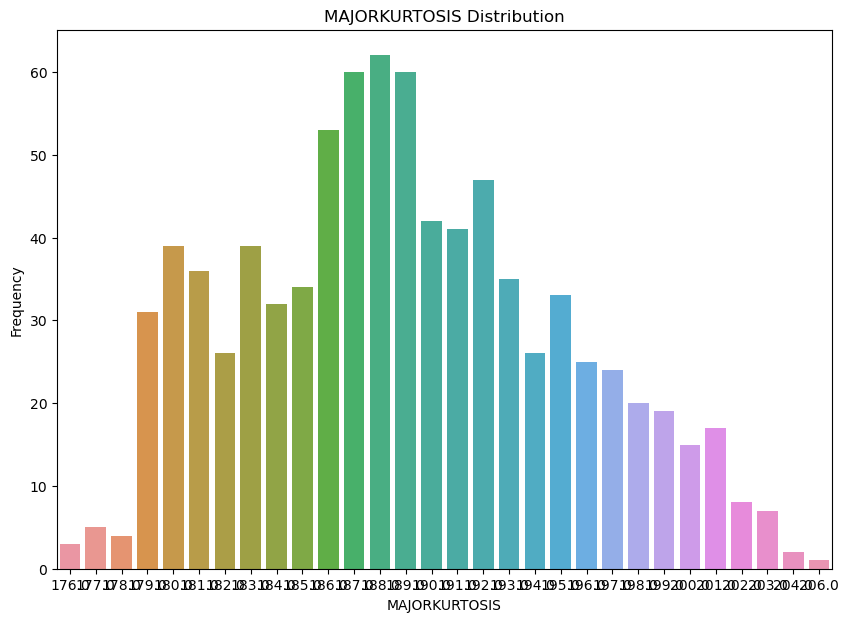

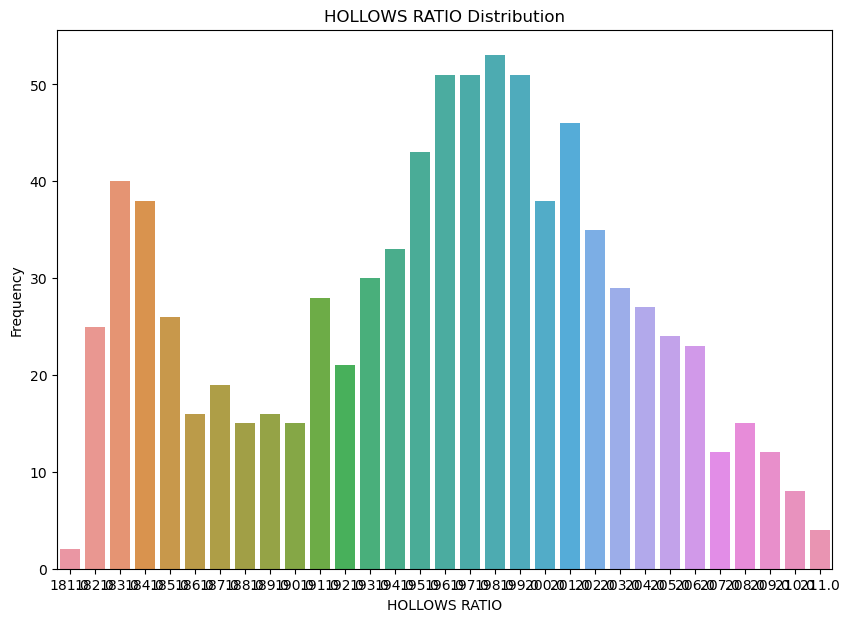

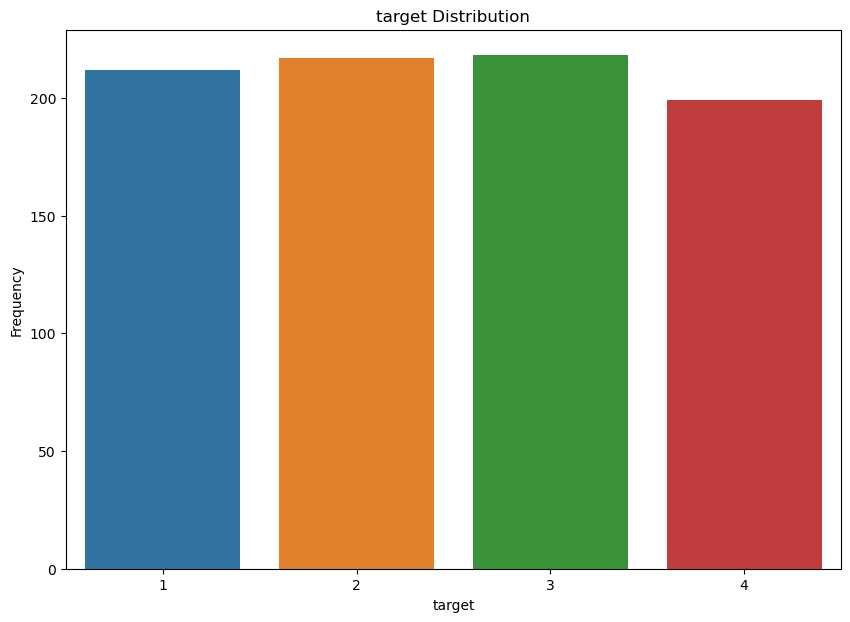

In [32]:
# It is used to show the distribution of categorical data or comparisons between groups.
# Kategorik verilerin dağılımını veya gruplar arasındaki karşılaştırmaları göstermek için kullanılır.

for var in dataset:
    plt.figure(figsize=(10, 7))
    sns.countplot(data=dataset, x=var)
    plt.title(f"{var} Distribution")
    plt.xlabel(var)
    plt.ylabel("Frequency")
    plt.show()

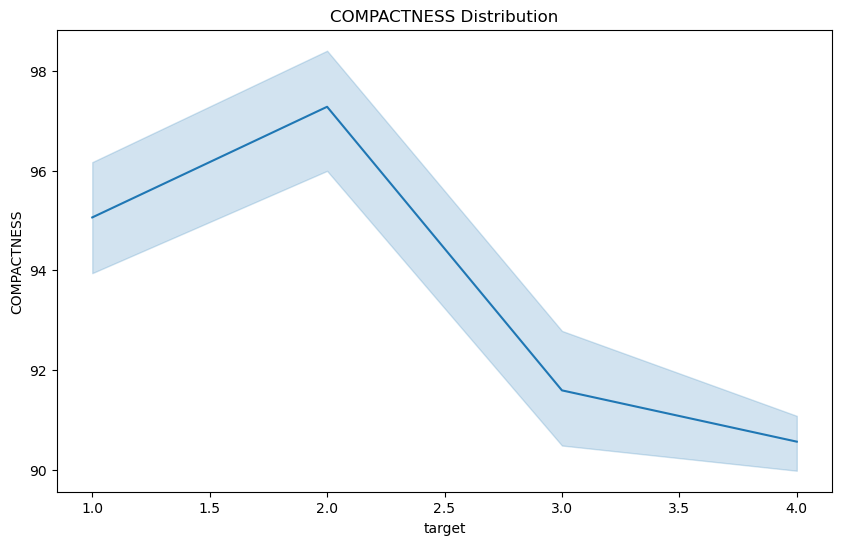

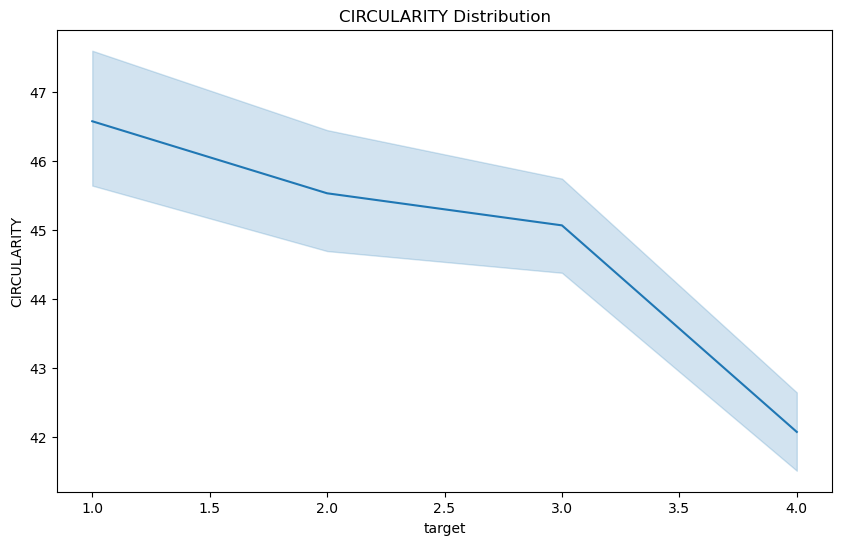

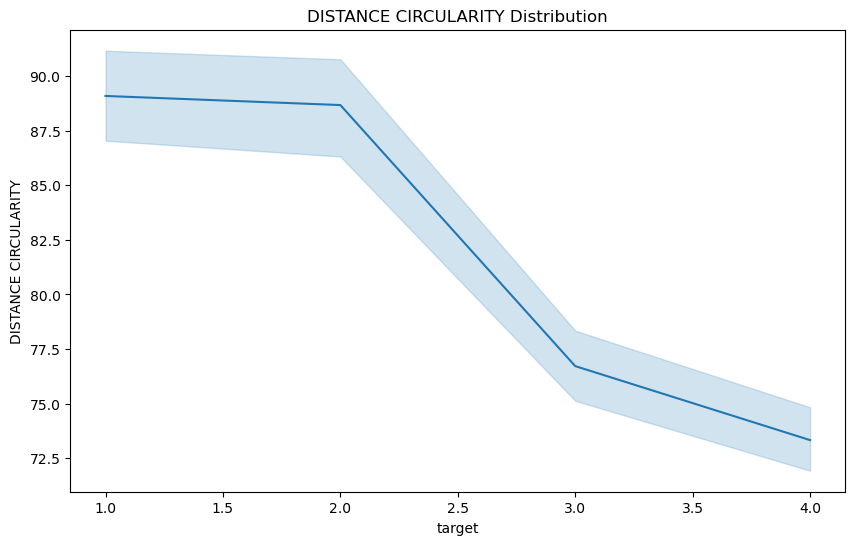

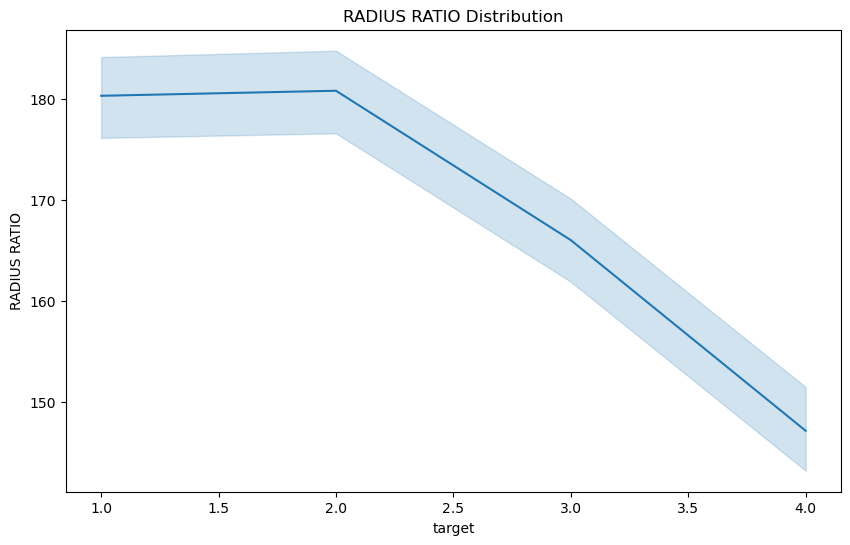

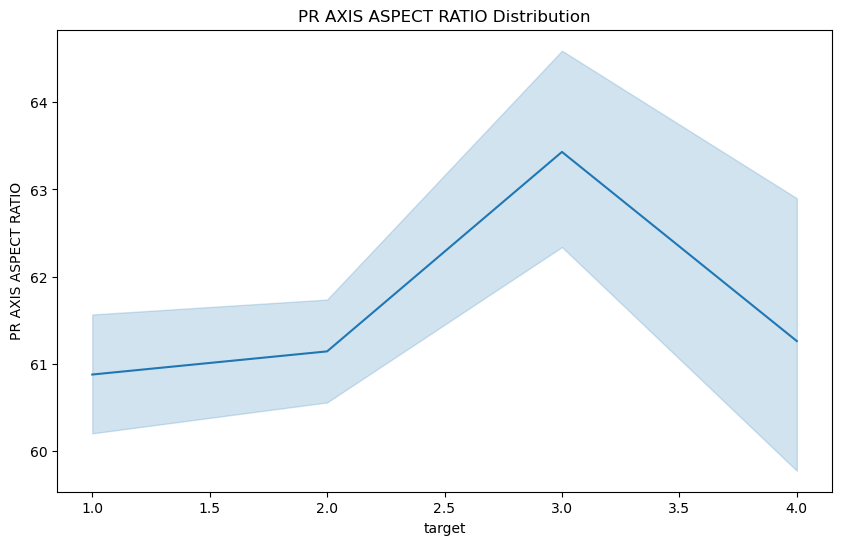

...

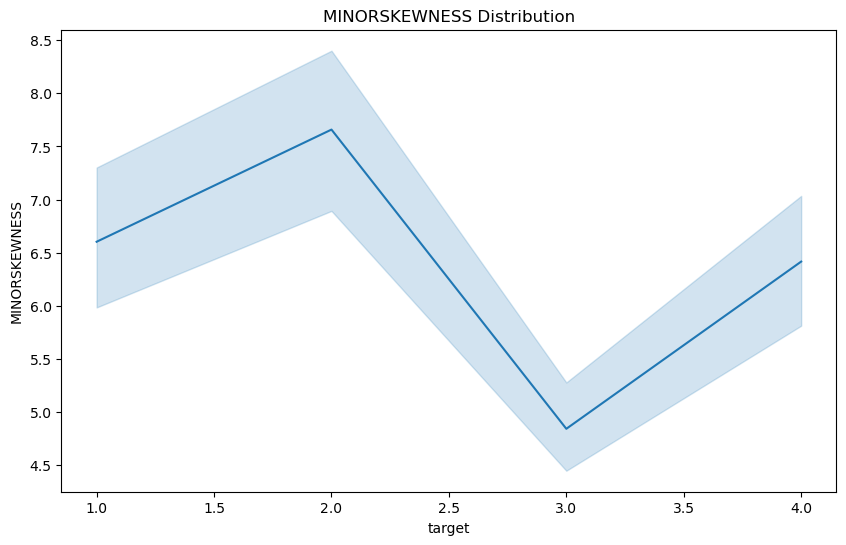

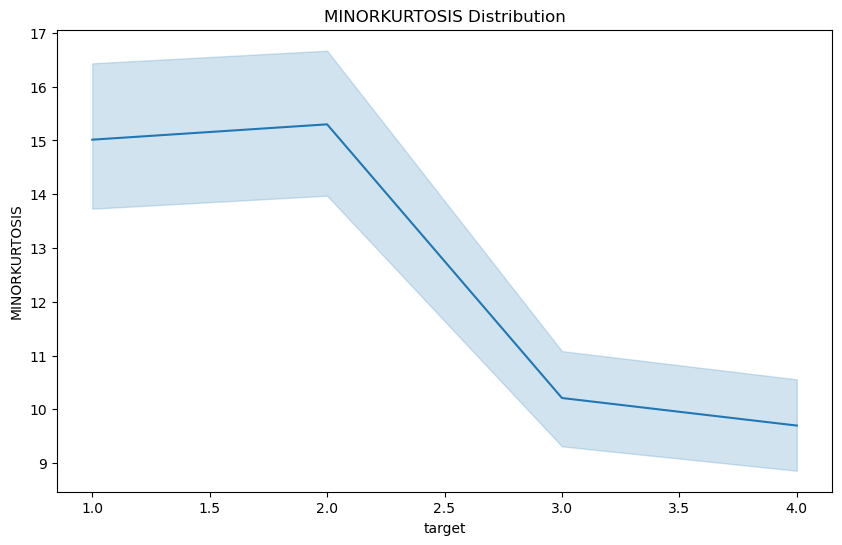

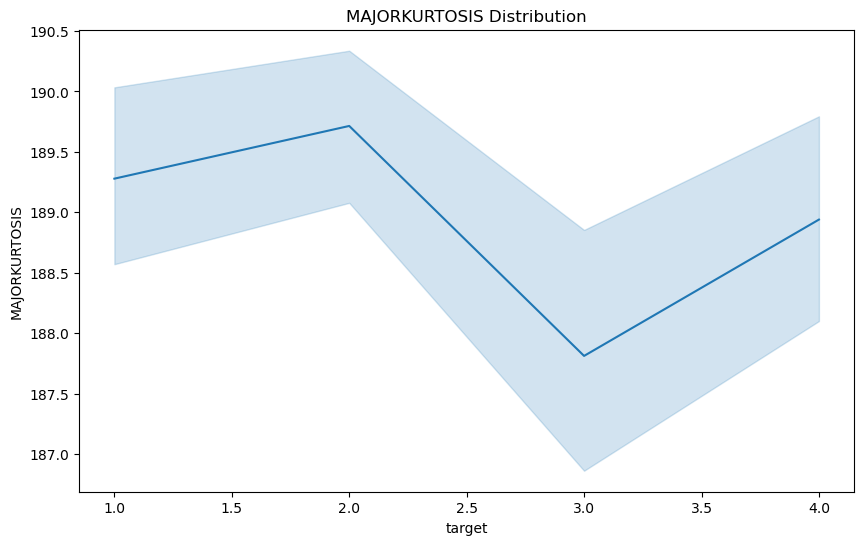

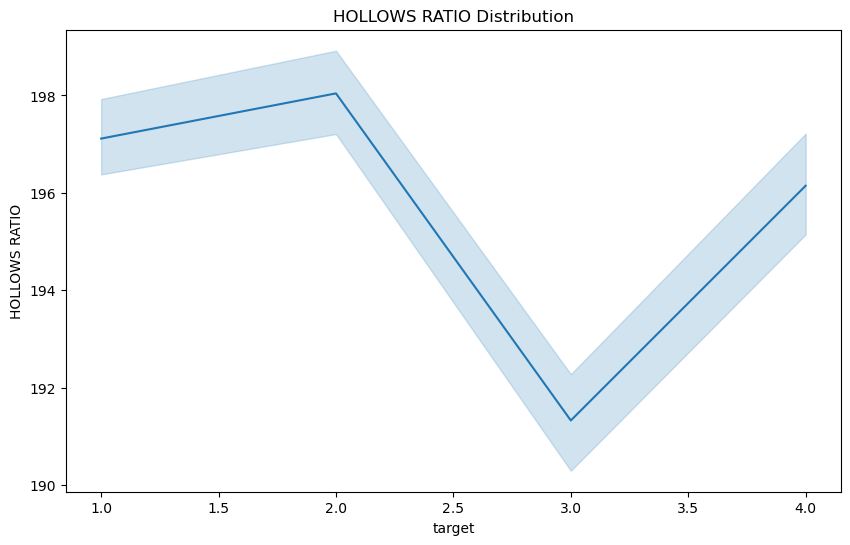

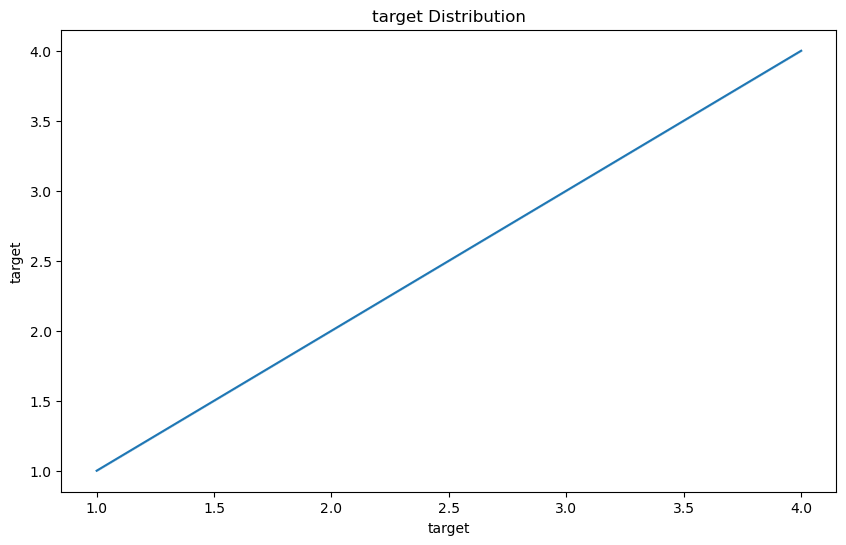

In [33]:

for var in dataset:
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=dataset, x='target', y=var)
    plt.title(f"{var} Distribution")
    plt.xlabel("target")
    plt.ylabel(var)
    plt.show()

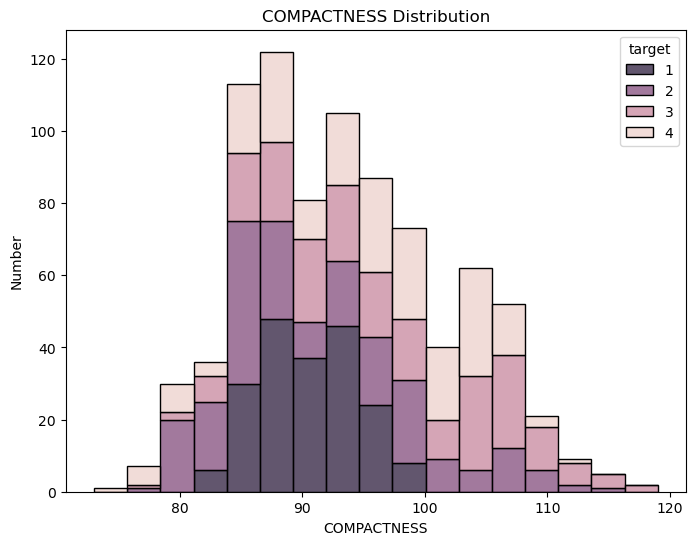

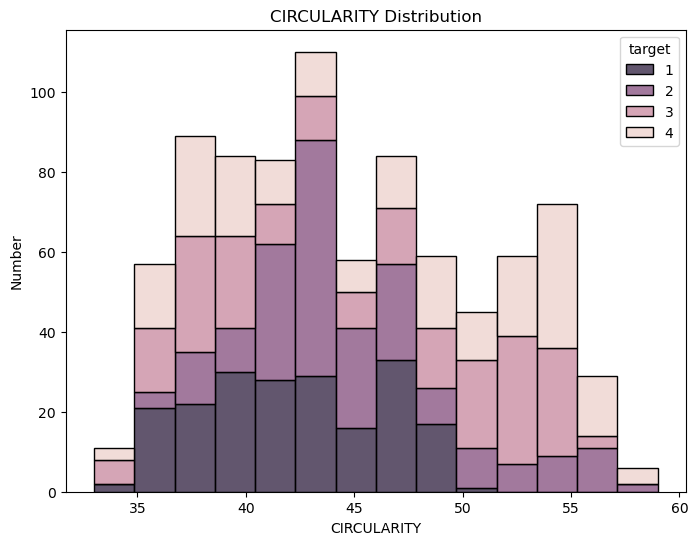

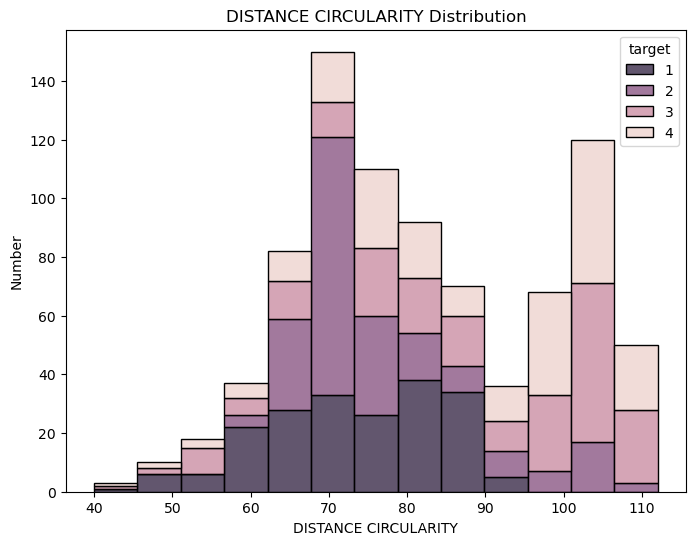

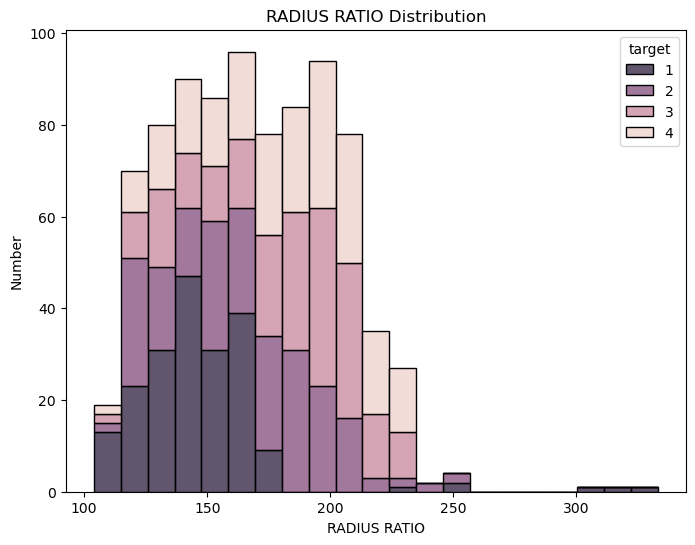

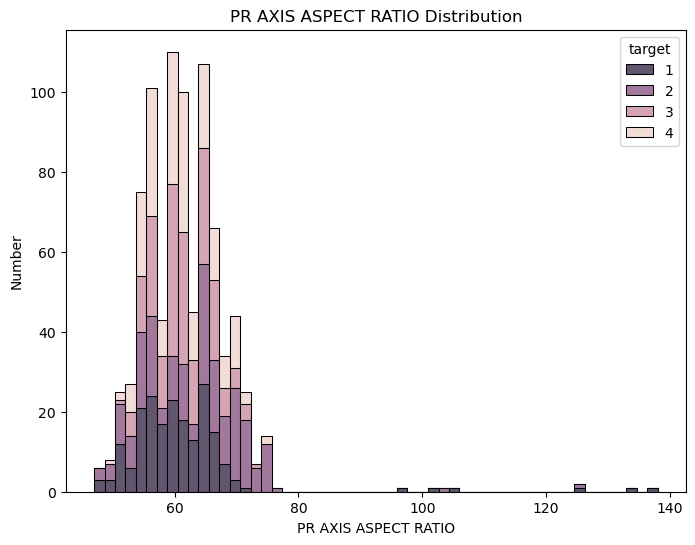

...

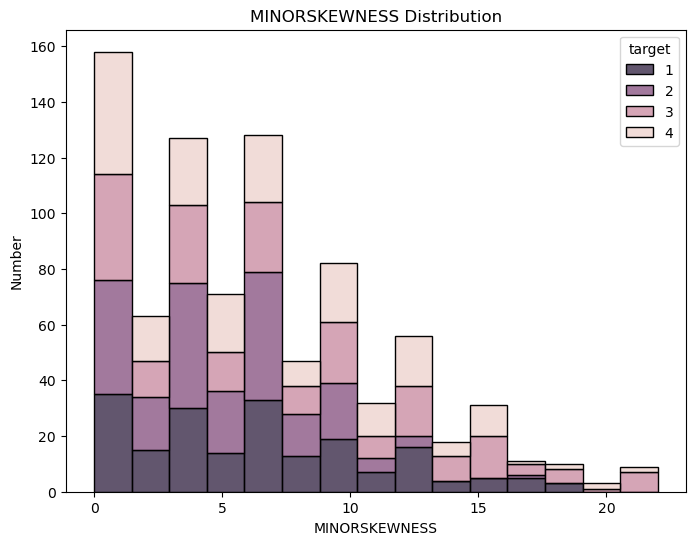

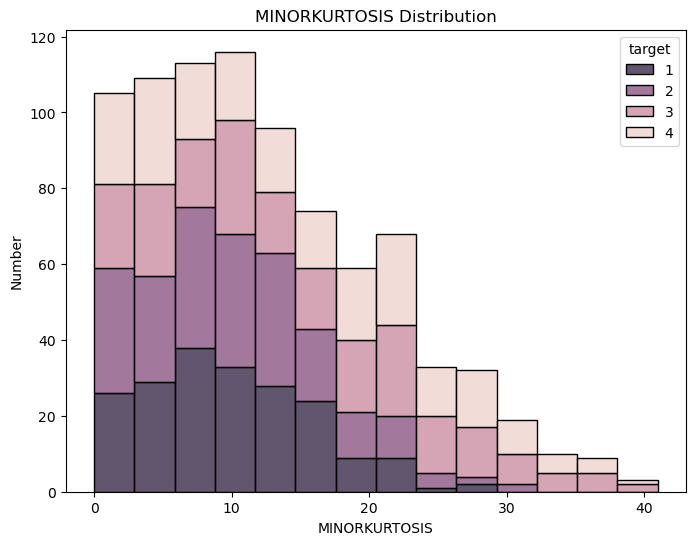

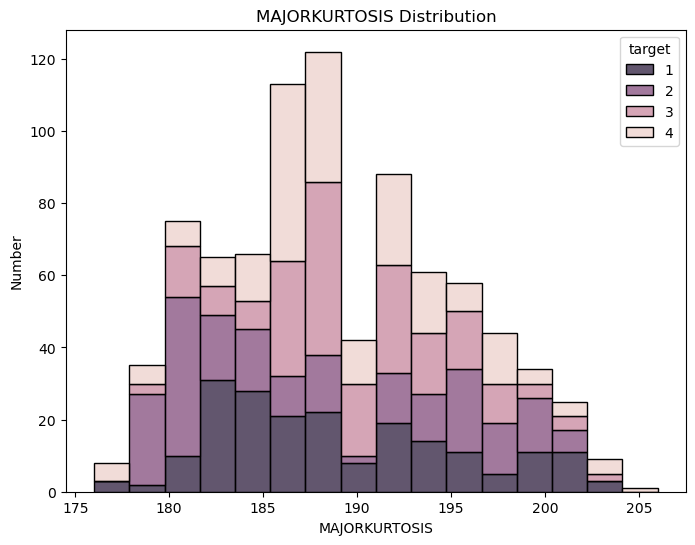

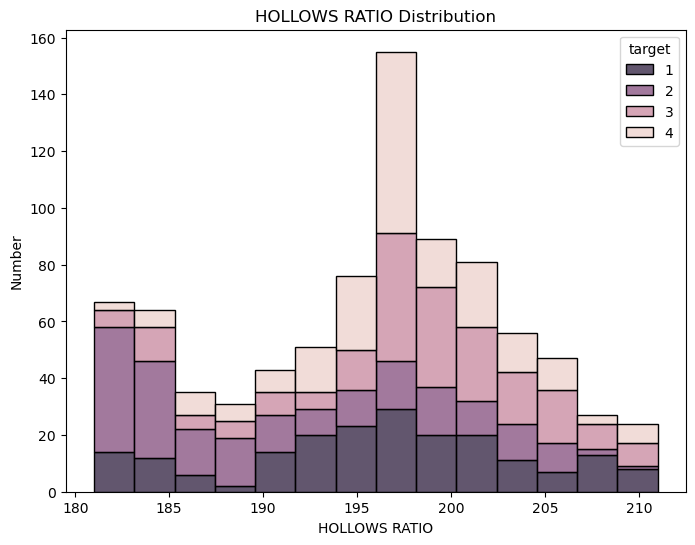

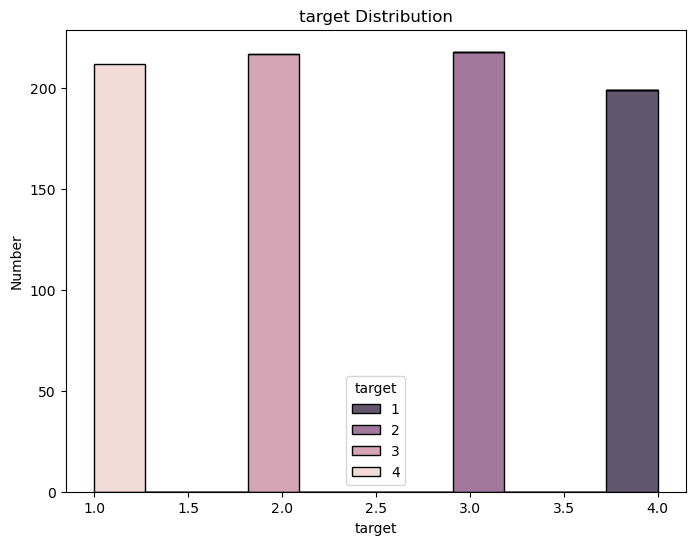

In [34]:
# Used to show the distribution or density of the data set.

target_var = 'target'

# Draw a scatter plot for each categorical variable
for var in dataset:
    plt.figure(figsize=(8, 6))
    sns.histplot(data=dataset, x=var, hue=target_var, multiple='stack')
    plt.title(f"{var} Distribution")
    plt.xlabel(var)
    plt.ylabel("Number")
    plt.legend(title='target', labels=dataset[target_var].unique())
    plt.show()

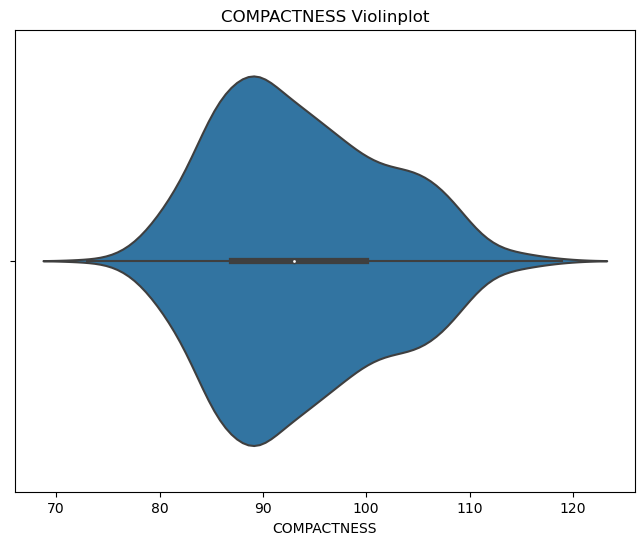

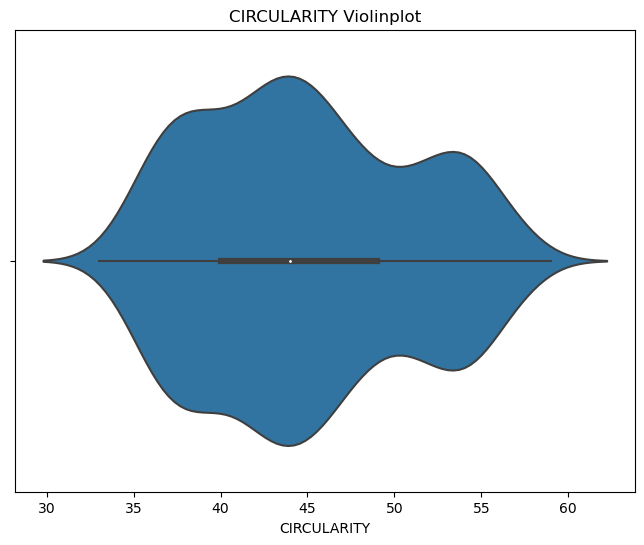

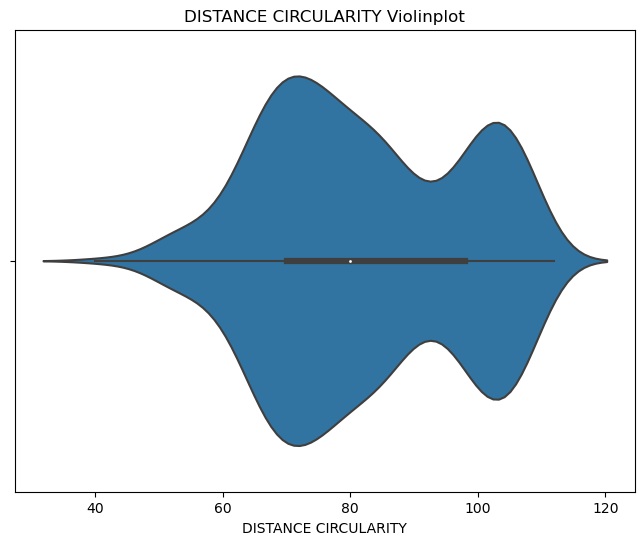

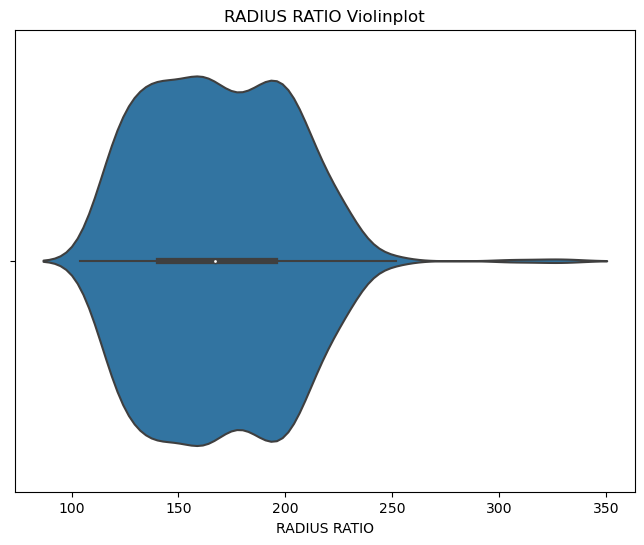

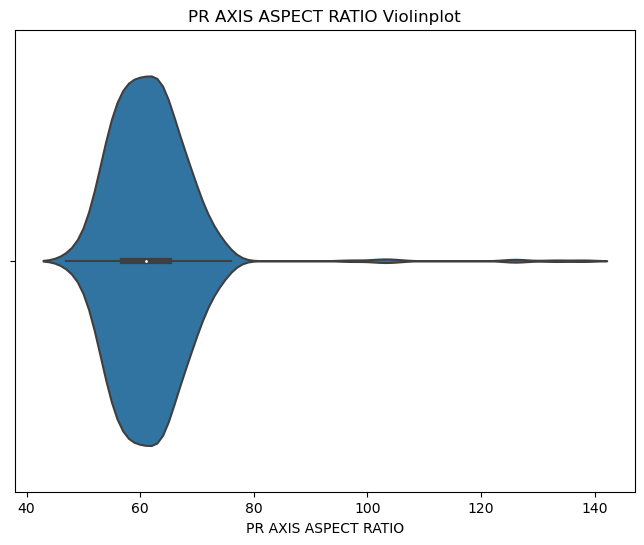

...

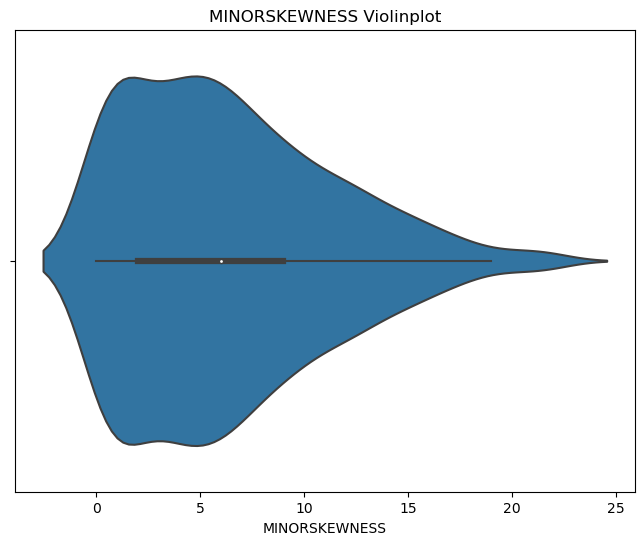

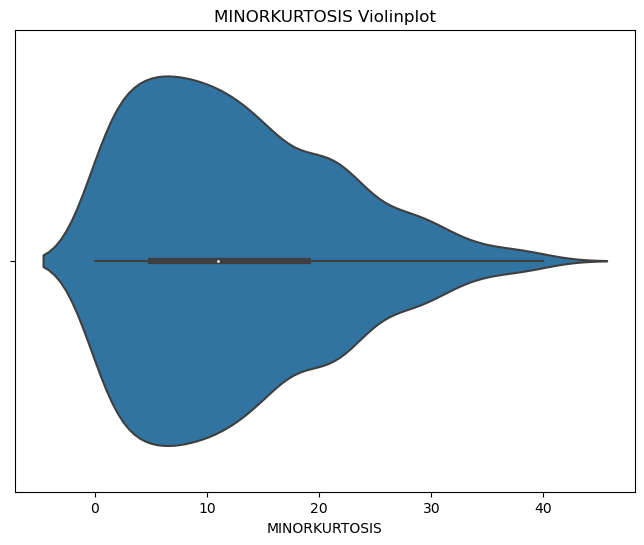

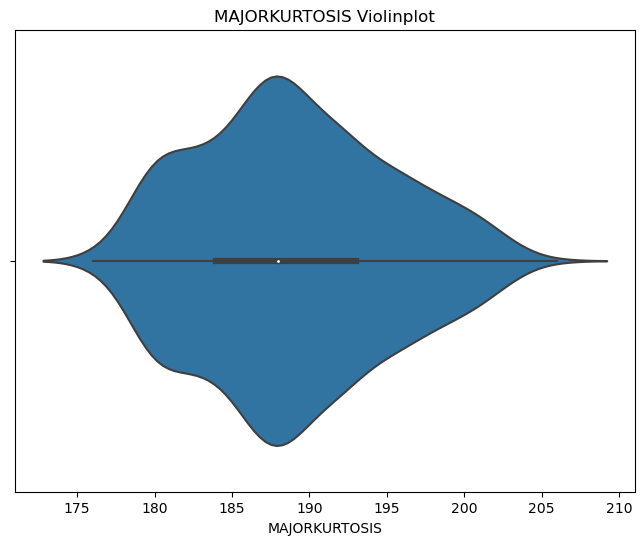

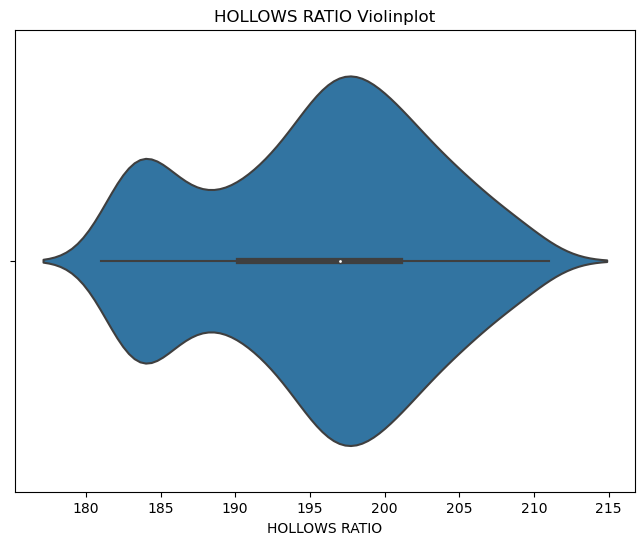

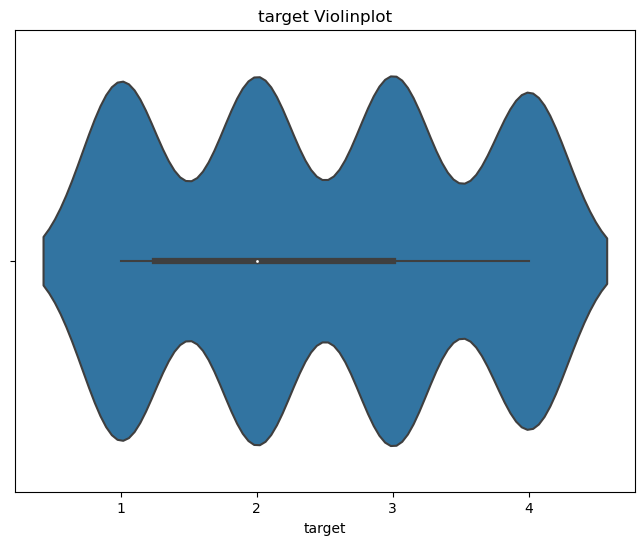

In [35]:
# It is used to show the distribution, density and median value of the data set.
# Veri setinin dağılımını, yoğunluğunu ve medyan değerini göstermek için kullanılır.

# Draw violinplot
for var in dataset:
    plt.figure(figsize=(8, 6))
    sns.violinplot(x=var, data=dataset)
    plt.title(f"{var} Violinplot")
    plt.show()

In [36]:
X = dataset.iloc[:, : 18]
y = dataset.iloc[:, 18] # target

In [37]:
print(y)

0      1
1      1
2      1
3      1
4      1
      ..
841    4
842    4
843    4
844    4
845    4
Name: target, Length: 846, dtype: int64


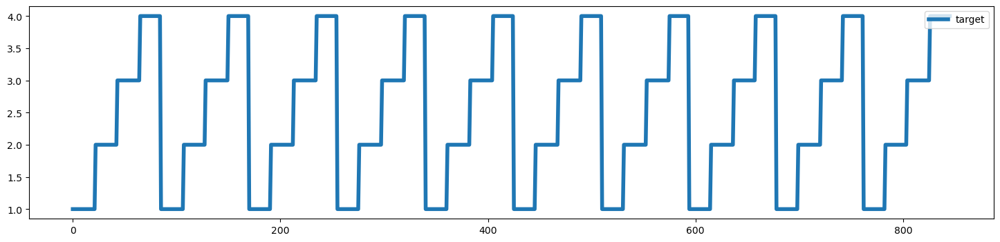

In [38]:
y.plot(figsize=(18,4), linewidth=4).legend(loc='upper right')

In [39]:
X.corr()

,COMPACTNESS,CIRCULARITY,DISTANCE CIRCULARITY,RADIUS RATIO,PR AXIS ASPECT RATIO,MAX LENGTH ASPECT RATIO,SCATTER RATIO,ELONGATEDNESS,PR AXISRECTANGULAR,LENGTHRECTANGULAR,MAJORVARIANCE,MINORVARIANCE,GYRATIONRADIUS,MAJORSKEWNESS,MINORSKEWNESS,MINORKURTOSIS,MAJORKURTOSIS,HOLLOWS RATIO
COMPACTNESS,1.000000,0.692869,0.792444,0.691659,0.093222,0.148249,0.813003,-0.788647,0.813437,0.676143,0.764415,0.818632,0.585347,-0.252984,0.233693,0.156779,0.297780,0.365552
CIRCULARITY,0.692869,1.000000,0.798492,0.622778,0.149692,0.247467,0.860367,-0.828755,0.857925,0.965776,0.808496,0.852679,0.936080,0.058669,0.148433,-0.015482,-0.113047,0.038677
DISTANCE CIRCULARITY,0.792444,0.798492,1.000000,0.771644,0.161529,0.264309,0.907280,-0.912307,0.895326,0.774524,0.864432,0.889661,0.705818,-0.231660,0.116478,0.264522,0.147980,0.335453
RADIUS RATIO,0.691659,0.622778,0.771644,1.000000,0.665407,0.448048,0.738460,-0.792557,0.711497,0.570154,0.797588,0.725781,0.539069,-0.182412,0.050534,0.174299,0.380757,0.469278
PR AXIS ASPECT RATIO,0.093222,0.149692,0.161529,0.665407,1.000000,0.648096,0.106064,-0.185086,0.079982,0.129168,0.274705,0.092182,0.124408,0.152304,-0.056807,-0.034180,0.238195,0.267381
MAX LENGTH ASPECT RATIO,0.148249,0.247467,0.264309,0.448048,0.648096,1.000000,0.166769,-0.180044,0.161861,0.305943,0.319430,0.144606,0.189791,0.294548,0.015218,0.043379,-0.027317,0.143919
SCATTER RATIO,0.813003,0.860367,0.907280,0.738460,0.106064,0.166769,1.000000,-0.973385,0.992088,0.810648,0.951862,0.996318,0.800932,-0.028618,0.074347,0.210706,0.004053,0.119950
ELONGATEDNESS,-0.788647,-0.828755,-0.912307,-0.792557,-0.185086,-0.180044,-0.973385,1.000000,-0.950512,-0.775531,-0.938392,-0.956522,-0.766146,0.104875,-0.053346,-0.185189,-0.112046,-0.216725
PR AXISRECTANGULAR,0.813437,0.857925,0.895326,0.711497,0.079982,0.161861,0.992088,-0.950512,1.000000,0.813305,0.938266,0.992346,0.798282,-0.016333,0.082346,0.213088,-0.022056,0.098519
LENGTHRECTANGULAR,0.676143,0.965776,0.774524,0.570154,0.129168,0.305943,0.810648,-0.775531,0.813305,1.000000,0.747152,0.798071,0.866479,0.040339,0.137473,0.001183,-0.107718,0.076770


#  --------------------------------------------------------------------------------------------------------------

# Linear Regression

Linear Regression is a machine learning algorithm that models the linear relationship of a dependent variable with independent variables. This algorithm is used to estimate the dependent variable when a set of independent variables is given.

Linear Regression (Doğrusal Regresyon), bağımlı bir değişkenin bağımsız değişkenlerle doğrusal ilişkisini modelleyen bir makine öğrenmesi algoritmasıdır. Bu algoritma, bir dizi bağımsız değişkenin verildiği durumlarda, bağımlı değişkenin tahminini yapmak için kullanılır. 

In [40]:
# Separating the data set into dependent and independent variables
X = dataset.iloc[:, : 18]
y = dataset.iloc[:, 18] # target

In [41]:
# Splitting the dataset into the Training set and Test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [42]:
# Fitting Simple Linear Regression for the Training set
linearRegression = LinearRegression()
linearRegression.fit(X_train, y_train)

LinearRegression()

In [43]:
# Obtaining the coefficients of the Linear Regression model
linearRegression.coef_

array([ 0.06643063, -0.2523524 ,  0.04070547, -0.05705134,  0.15348906,
       -0.05548806, -0.1103426 , -0.06751254, -0.11321231,  0.10894954,
        0.0049824 ,  0.01660453,  0.01267558,  0.02668012, -0.0338604 ,
       -0.00161687,  0.07918771, -0.02766653])

In [44]:
coefficientDataframe = pd.DataFrame(linearRegression.coef_, X.columns, columns=['Coefficient'])
coefficientDataframe.sort_values(by="Coefficient")

,Coefficient
CIRCULARITY,-0.252352
PR AXISRECTANGULAR,-0.113212
SCATTER RATIO,-0.110343
ELONGATEDNESS,-0.067513
RADIUS RATIO,-0.057051
MAX LENGTH ASPECT RATIO,-0.055488
MINORSKEWNESS,-0.033860
HOLLOWS RATIO,-0.027667
MINORKURTOSIS,-0.001617
MAJORVARIANCE,0.004982


In [45]:
print("Linear Regression Score: ", linearRegression.score(X_train, y_train))

Linear Regression Score:  0.6238903384819202


In [46]:
# Making predictions on the training dataset
y_train_pred = linearRegression.predict(X_train)

# Making predictions on the test dataset
y_test_pred = linearRegression.predict(X_test)

# Calculating training and test error values
train_error = y_train - y_train_pred
test_error = y_test - y_test_pred

In the code, we combine the training and test error values and assign them to the all_errors variable. Next, we plot the distribution of error values as a histogram using the plt.hist() function.

Kodda, eğitim ve test hata değerlerini birleştirerek all_errors değişkenine atıyoruz. Ardından, plt.hist() fonksiyonunu kullanarak hata değerlerinin dağılımını histogram olarak çizdiriyoruz.

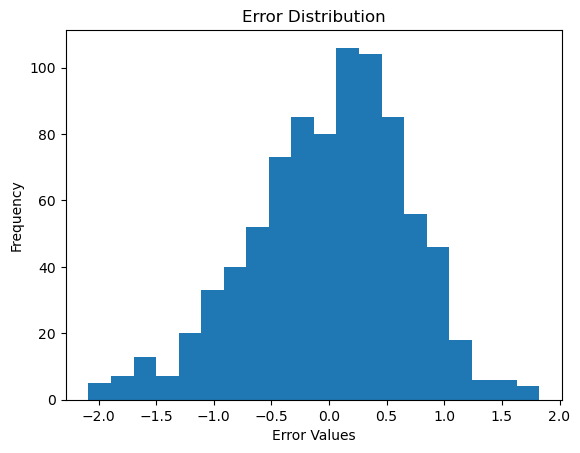

In [47]:
# Combining training and test error values
all_errors = pd.concat([train_error, test_error])

# Visualizing the error distribution with a histogram
plt.hist(all_errors, bins=20)
plt.xlabel("Error Values")
plt.ylabel("Frequency")
plt.title("Error Distribution")
plt.show()

In this code, we combine the actual values with the predicted values and assign them to the variables y_combined and y_pred_combined. Next, we plot a scatter plot comparing the actual and predicted values using the plt.scatter() function.

Bu kodda, gerçek değerler ile tahmin edilen değerleri birleştirerek y_combined ve y_pred_combined değişkenlerine atıyoruz. Sonra, plt.scatter() fonksiyonunu kullanarak gerçek ve tahmin edilen değerleri karşılaştıran bir scatter plot çizdiriyoruz.

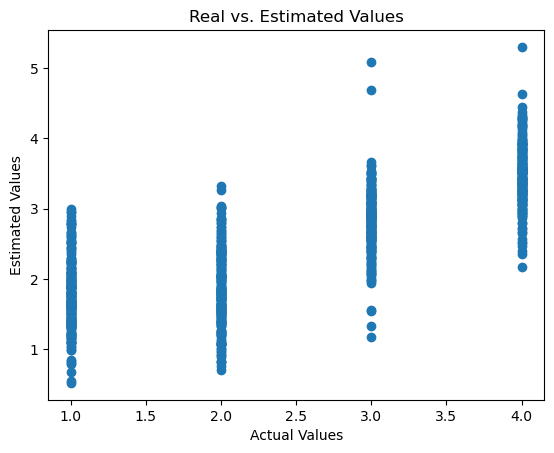

In [48]:
# Combining actual and predicted values
y_combined = np.concatenate([y_train, y_test])
y_pred_combined = np.concatenate([y_train_pred, y_test_pred])

# Comparing actual and predicted values
plt.scatter(y_combined, y_pred_combined)
plt.xlabel("Actual Values")
plt.ylabel("Estimated Values")
plt.title("Real vs. Estimated Values")
plt.show()

In this code, we calculate errors between actual and predicted values using error metrics such as mean_absolute_error(), mean_squared_error(), and r2_score(). Next, we print these error metrics to the screen.

Bu kodda, mean_absolute_error(), mean_squared_error(), ve r2_score() gibi hata metriklerini kullanarak gerçek ve tahmin edilen değerler arasındaki hataları hesaplıyoruz. Sonrasında, bu hata metriklerini ekrana yazdırıyoruz.

In [49]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Calculating error metrics
mae = mean_absolute_error(y_test, y_test_pred)
mse = mean_squared_error(y_test, y_test_pred)
r2 = r2_score(y_test, y_test_pred)

print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("R^2 Score:", r2)

Mean Absolute Error (MAE): 0.5986301500793557
Mean Squared Error (MSE): 0.5068113549575929
R^2 Score: 0.6124044521348955


# ---------------------------------------------------------------------------------------------------------------

# Cross Validate

Cross-validation is a method used to evaluate the performance of a model.

Cross-validation, bir modelin performansını değerlendirmek için kullanılan bir yöntemdir. 

In [50]:
result = cross_validate(linearRegression, X, y, cv=10, scoring="neg_mean_absolute_error", return_train_score=True)
print(result["test_score"])
print(result["train_score"])

[-0.5536068  -0.56079947 -0.55600777 -0.6020446  -0.48551228 -0.52303626
 -0.57681187 -0.60383364 -0.5365496  -0.55917286]
[-0.54102034 -0.53893559 -0.54120476 -0.5353337  -0.5473775  -0.5418599
 -0.53890308 -0.5338429  -0.54155803 -0.53631178]


In [51]:
result

{'fit_time': array([0.00399709, 0.00299788, 0.00300074, 0.00299835, 0.00299907,
        0.00199556, 0.00199723, 0.00199914, 0.00099683, 0.00200582]),
 'score_time': array([0.00199986, 0.00099993, 0.00099897, 0.00100064, 0.00100017,
        0.00299978, 0.0010016 , 0.00100112, 0.0010004 , 0.00099945]),
 'test_score': array([-0.5536068 , -0.56079947, -0.55600777, -0.6020446 , -0.48551228,
        -0.52303626, -0.57681187, -0.60383364, -0.5365496 , -0.55917286]),
 'train_score': array([-0.54102034, -0.53893559, -0.54120476, -0.5353337 , -0.5473775 ,
        -0.5418599 , -0.53890308, -0.5338429 , -0.54155803, -0.53631178])}

In [52]:
# r-Square error
result1 = cross_validate(linearRegression, X, y, cv=10, scoring="r2", return_train_score=True)
print(result1["test_score"])
print(result1["train_score"])

[0.6395224  0.61886436 0.63546029 0.55870378 0.68232052 0.63392282
 0.52419775 0.52018114 0.5955068  0.5459554 ]
[0.62121946 0.62400049 0.62147094 0.62999762 0.61712805 0.62164725
 0.63234924 0.63404496 0.62506189 0.62713857]


In [53]:
# root mean square error
result2=cross_validate(linearRegression, X, y, cv=10, scoring="neg_root_mean_squared_error", return_train_score=True)
print(result2["test_score"])
print(result2["train_score"])

[-0.66786545 -0.68673569 -0.66535329 -0.73205716 -0.62111851 -0.6667549
 -0.7559687  -0.76686199 -0.70409971 -0.74611046]
[-0.67959515 -0.67709575 -0.68008495 -0.67238158 -0.68397515 -0.67992655
 -0.67063532 -0.66835322 -0.6765065  -0.67461374]


In [54]:
# mean square log error
result3=cross_validate(linearRegression, X, y, cv=10, scoring="neg_mean_squared_log_error", return_train_score=True)
print(result3["test_score"])
print(result3["train_score"])

[-0.04652988 -0.0539338  -0.0573677  -0.06316128 -0.04649393 -0.04943342
 -0.06200719 -0.06805386 -0.0530871  -0.05268276]
[-0.05311014 -0.05245051 -0.05236551 -0.05153119 -0.05333954 -0.05300794
 -0.05189102 -0.05122863 -0.05255359 -0.05198374]


In [55]:
# median absolute error: he MAD is resistant to outliers. The presence of outliers does not change the value of the MAD
result4=cross_validate(linearRegression, X, y, cv=10, scoring="neg_median_absolute_error", return_train_score=True)
print(result4["test_score"])
print(result4["train_score"])

[-0.49061489 -0.4895294  -0.47599139 -0.51768312 -0.39174353 -0.45675166
 -0.43725429 -0.60807464 -0.43646062 -0.43678501]
[-0.44459551 -0.44815011 -0.45782961 -0.44594122 -0.45876744 -0.4577024
 -0.44884592 -0.44797771 -0.45613786 -0.45623435]


In [56]:
# mean absoulte percentage error
result8=cross_validate(linearRegression, X, y, cv=10, scoring="neg_mean_absolute_percentage_error", return_train_score=True)
print(-1*result8["test_score"])
print(-1*result8["train_score"])

[0.3022452  0.32760467 0.34166921 0.36965027 0.29398759 0.3137568
 0.32030237 0.3680827  0.31386653 0.31438356]
[0.32044833 0.31756272 0.31877629 0.31491291 0.32259306 0.32041089
 0.31768265 0.31448249 0.31961019 0.31610031]


# ---------------------------------------------------------------------------------------------------------------

# KNN

K-Nearest Neighbors (KNN) is a machine learning algorithm used to perform classification or regression based on the closeness measure of data points.

K-Nearest Neighbors (KNN), veri noktalarının yakınlık ölçüsüne dayanarak sınıflandırma veya regresyon yapmak için kullanılan bir makine öğrenmesi algoritmasıdır.

In [57]:
# Separating the data set into dependent and independent variables
X = dataset.iloc[:, : 18]
y = dataset.iloc[:, 18] # target

In [58]:
# Splitting the dataset into the Training set and Test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [59]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

676
676
170
170


In order for the KNN algorithm to be applied correctly, the features are usually scaled so that they have the same scale. This process normalizes the features in the dataset and helps to represent each feature at the same scale.

Doğru bir şekilde KNN algoritması uygulanabilmesi için genellikle öznitelikleri aynı ölçeğe sahip olacak şekilde ölçeklendirme işlemi yapılır. Bu işlem veri setindeki öznitelikleri normalize eder ve her bir özniteliği aynı ölçekte temsil etmeye yardımcı olur.

In [60]:
# Feature scaling
sc_X = StandardScaler()
X_train = sc_X.fit_transform(X_train)
X_test = sc_X.transform(X_test)

In [61]:
import math
# Find the square root of 614
sqrt = math.sqrt(676 - 170)
print(sqrt)

22.494443758403985


In [62]:
# Define the model: Init K-NN
classifier = KNeighborsClassifier(n_neighbors=23, metric='euclidean')

In [63]:
# Fit Model
classifier.fit(X_train, y_train)

KNeighborsClassifier(metric='euclidean', n_neighbors=23)

In [64]:
# Predict the test set results
y_pred = classifier.predict(X_test)
y_pred

C:\Users\dogan\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


array([2, 4, 3, 1, 1, 2, 4, 3, 1, 1, 2, 4, 3, 2, 3, 2, 1, 2, 4, 3, 1, 1,
       2, 1, 4, 1, 4, 1, 4, 4, 2, 2, 4, 3, 3, 3, 3, 3, 3, 3, 4, 1, 1, 2,
       4, 3, 4, 3, 1, 1, 3, 3, 1, 4, 3, 2, 4, 4, 3, 1, 3, 1, 2, 4, 4, 3,
       1, 4, 4, 2, 4, 4, 2, 2, 3, 2, 4, 4, 3, 4, 4, 3, 2, 4, 3, 1, 2, 4,
       2, 2, 2, 4, 1, 3, 4, 4, 4, 2, 3, 3, 1, 2, 2, 4, 2, 2, 2, 1, 4, 4,
       1, 3, 2, 1, 3, 3, 2, 3, 1, 1, 2, 3, 4, 1, 2, 3, 2, 3, 4, 3, 3, 4,
       2, 4, 3, 2, 1, 2, 1, 2, 2, 1, 3, 4, 1, 4, 1, 2, 3, 3, 4, 1, 1, 1,
       4, 2, 2, 2, 4, 4, 3, 1, 4, 1, 4, 2, 2, 4, 1, 3], dtype=int64)

In [65]:
cm = confusion_matrix(y_test, y_pred)
print (cm)

[[23 17  1  4]
 [15 26  1  4]
 [ 0  0 34  0]
 [ 0  0  6 39]]


In [66]:
# Calculating performance metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='micro')
recall = recall_score(y_test, y_pred, average='micro')
f1 = f1_score(y_test, y_pred, average='micro')

In [67]:
print("Accuracy Score:", accuracy)
print("Precision Score:", precision)
print("Recall Score:", recall)
print("F1 Score:", f1)

Accuracy Score: 0.7176470588235294
Precision Score: 0.7176470588235294
Recall Score: 0.7176470588235294
F1 Score: 0.7176470588235294


# --------------------------------------------------------------------------------------------------------------- 

# Decision Tree

Decision Tree is a machine learning algorithm and can be used in classification or regression problems. The Decision Tree creates a set of decision rules using the features in the data set and uses this rule set to classify or predict the value of new data.

Decision Tree (Karar Ağacı), bir makine öğrenmesi algoritmasıdır ve sınıflandırma veya regresyon problemlerinde kullanılabilir. Karar Ağacı, veri kümesindeki özellikleri kullanarak bir dizi karar kuralı oluşturur ve bu kural setini kullanarak yeni verilerin sınıflandırılmasını veya değer tahminini yapar.

In [68]:
# Separating the data set into dependent and independent variables
X = dataset.iloc[:, : 18]
y = dataset.iloc[:, 18] # target

In [69]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=0)

In [70]:
# Create a decision tree classifier
clf = DecisionTreeClassifier(criterion = "gini", random_state=42)

# Train the classifier on the training data
clf.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [71]:
# Make predictions on the test data
y_pred = clf.predict(X_test)

In [72]:
# Calculating performance metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

In [73]:
print("Accuracy Score:", accuracy)
print("Precision Score:", precision)
print("Recall Score:", recall)
print("F1 Score:", f1)

Accuracy Score: 0.788235294117647
Precision Score: 0.8251167133520074
Recall Score: 0.788235294117647
F1 Score: 0.8000580771307316


# ---------------------------------------------------------------------------------------------------------------

# PCA

PCA (Principal Component Analysis) is a method used to analyze the relationships between variables in the data set and to make dimension reduction.

PCA (Principal Component Analysis), veri setindeki değişkenler arasındaki ilişkileri analiz etmek ve boyut azaltma yapmak için kullanılan bir yöntemdir. 

In [74]:
# Separating the data set into dependent and independent variables
X = dataset.iloc[:, : 18]
y = dataset.iloc[:, 18] # target

In [75]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=0)

In [76]:
# Dataset must be scaled before applying PCA. (Standardization)
# Therefore, to standardize the data, subtract the mean value of the data and divide by its standard deviations.
scaler = StandardScaler()
X = scaler.fit_transform(X)

In [77]:
# Create the PCA model
pca = PCA(n_components=2)

In [78]:
# Apply PCA to the dataset and transform it
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

In [79]:
# Train the classifier (e.g. KNN)
classifier = KNeighborsClassifier()
classifier.fit(X_train_pca, y_train)

KNeighborsClassifier()

In [80]:
# Make predictions on the test dataset
y_pred = classifier.predict(X_test_pca)

C:\Users\dogan\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


In [81]:
# Calculating performance metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='micro')
recall = recall_score(y_test, y_pred, average='micro')
f1 = f1_score(y_test, y_pred, average='micro')

In [82]:
print("Accuracy Score:", accuracy)
print("Precision Score:", precision)
print("Recall Score:", recall)
print("F1 Score:", f1)

Accuracy Score: 0.4470588235294118
Precision Score: 0.4470588235294118
Recall Score: 0.4470588235294118
F1 Score: 0.4470588235294118


In [83]:
principalComponents = pca.fit_transform(X)

In [84]:
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])
finalDf = pd.concat([principalDf, pd.DataFrame(y, columns = ['Y'])], axis = 1)

In [85]:
X_pca = principalComponents

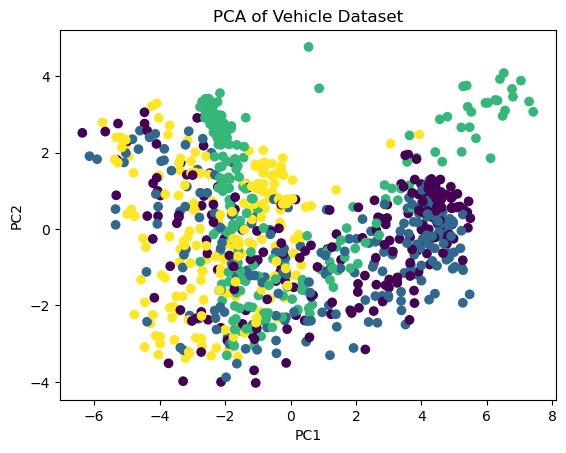

In [86]:
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA of Vehicle Dataset')
plt.show()

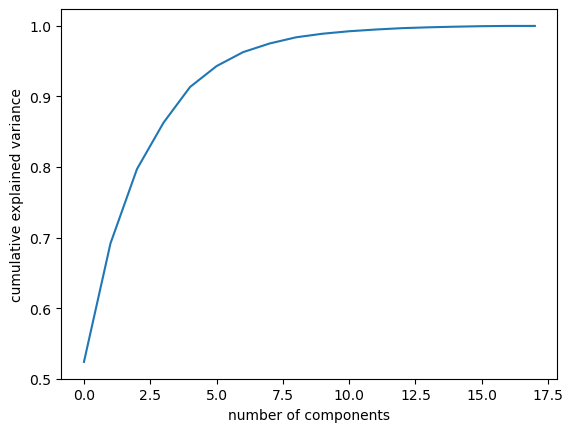

In [87]:
pca = PCA (whiten = True).fit(X) 
plt.plot(np.cumsum(pca.explained_variance_ratio_)) 
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

# ---------------------------------------------------------------------------------------------------------------

# Random Forest

Random Forest is an ensemble (community) algorithm formed by many decision trees. Each decision tree is trained using random sampling and random feature selection, and as a result, the algorithm combines the predictions of these trees to make a more accurate and stable prediction.

Random Forest, birçok karar ağacının bir araya gelerek oluşturduğu bir ensemble (topluluk) algoritmasıdır. Her bir karar ağacı, rastgele örnekleme ve rastgele öznitelik seçimi kullanarak eğitilir ve sonuçta algoritma, bu ağaçların tahminlerini birleştirerek daha doğru ve istikrarlı bir tahmin yapar.

In [88]:
# Separating the data set into dependent and independent variables
X = dataset.iloc[:, : 18]
y = dataset.iloc[:, 18] # target

In [89]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=0)

In [90]:
# Building and training the Random Forest classifier model
rf = RandomForestClassifier()
rf.fit(X_train, y_train)

RandomForestClassifier()

In [91]:
# Making predictions on test data
y_pred = rf.predict(X_test)

In [92]:
# Calculating performance metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='micro')
recall = recall_score(y_test, y_pred, average='micro')
f1 = f1_score(y_test, y_pred, average='micro')

In [93]:
print("Accuracy Score:", accuracy)
print("Precision Score:", precision)
print("Recall Score:", recall)
print("F1 Score:", f1)

Accuracy Score: 0.8352941176470589
Precision Score: 0.8352941176470589
Recall Score: 0.8352941176470589
F1 Score: 0.8352941176470589


# ---------------------------------------------------------------------------------------------------------------

# Support Vector Machines (SVM)

Support Vector Machines is a machine learning algorithm used for classification and regression problems. SVM tries to find a hyperplane that separates the data well.

Support Vector Machines, sınıflandırma ve regresyon problemleri için kullanılan bir makine öğrenmesi algoritmasıdır. SVM, verileri iyi bir şekilde ayıran bir hiper düzlem bulmaya çalışır.

In [94]:
# Separating the data set into dependent and independent variables
X = dataset.iloc[:, : 18]
y = dataset.iloc[:, 18] # target

In [95]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [96]:
# Build and train the SVM model
svm = SVC()
svm.fit(X_train, y_train)

SVC()

In [97]:
y_pred = svm.predict(X_test)

In [98]:
# Calculating performance metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='micro')
recall = recall_score(y_test, y_pred, average='micro')
f1 = f1_score(y_test, y_pred, average='micro')

In [99]:
print("Accuracy Score:", accuracy)
print("Precision Score:", precision)
print("Recall Score:", recall)
print("F1 Score:", f1)

Accuracy Score: 0.4470588235294118
Precision Score: 0.4470588235294118
Recall Score: 0.4470588235294118
F1 Score: 0.4470588235294118


# ---------------------------------------------------------------------------------------------------------------

# Clustering

Clustering is a machine learning method used to group data according to certain characteristics. Clustering algorithms try to group data into clusters based on the similarity measure in the data set.

Kümeleme (Clustering), verileri belirli özelliklerine göre gruplara ayırmak için kullanılan bir makine öğrenmesi yöntemidir. Kümeleme algoritmaları, veri setinde benzerlik ölçüsüne dayalı olarak verileri kümeler halinde gruplamaya çalışır.

In [100]:
# Separating the data set into dependent and independent variables
X = dataset.iloc[:, : 18]
y = dataset.iloc[:, 18] # target

Elbow method: In this method, the total inertia value decreases as the number of clusters increases. The Elbow method tries to find the "elbow" where the rate of decline of the inertia value slows down to determine the number of clusters. We can determine the optimal number of clusters by calculating and graphing the inertia values for different cluster numbers using the Elbow method.

Elbow yöntemi: Bu yöntemde, küme sayısının artmasıyla birlikte toplam küme içi hata (inertia) değeri azalır. Elbow yöntemi, küme sayısını belirlemek için inertia değerinin düşme hızının yavaşladığı "dirsek" noktasını bulmaya çalışır. Elbow yöntemini kullanarak farklı küme sayıları için inertia değerlerini hesaplayıp, grafiğini çizerek optimal küme sayısını belirleyebiliriz.

C:\Users\dogan\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


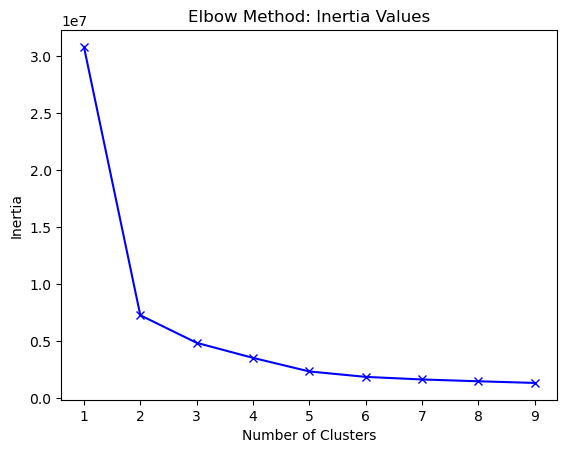

In [101]:
# Calculating inertia values for different cluster numbers
inertia_values = []
k_values = range(1, 10)  # Range of cluster numbers to test

for k in k_values:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    inertia_values.append(kmeans.inertia_)

# Graphing inertia values
plt.plot(k_values, inertia_values, 'bx-')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method: Inertia Values')
plt.show()

In [102]:
# Analyze the resulting cluster tags
cluster_labels = kmeans.labels_
clusters = pd.DataFrame({'Data Point': X.index, 'Cluster': cluster_labels})
print(clusters)

     Data Point  Cluster
0             0        2
1             1        7
2             2        7
3             3        5
4             4        1
..          ...      ...
841         841        6
842         842        6
843         843        0
844         844        6
845         845        6

[846 rows x 2 columns]


# ---------------------------------------------------------------------------------------------------------------

# Logistic Regression

In [103]:
X = dataset.iloc[:, : 18]
y = dataset.iloc[:, 18] # target

In [104]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [105]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [106]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [107]:
# Build and train the Logistic Regression model
logreg = LogisticRegression(max_iter=1000)
logreg.fit(X_train, y_train)

C:\Users\dogan\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(max_iter=1000)

In [108]:
# Making predictions on test data
y_pred = logreg.predict(X_test)

In [109]:
# Calculating performance metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='micro')
recall = recall_score(y_test, y_pred, average='micro')
f1 = f1_score(y_test, y_pred, average='micro')

In [110]:
print("Accuracy Score:", accuracy)
print("Precision Score:", precision)
print("Recall Score:", recall)
print("F1 Score:", f1)

Accuracy Score: 0.8294117647058824
Precision Score: 0.8294117647058824
Recall Score: 0.8294117647058824
F1 Score: 0.8294117647058825
